# Exploration of Conformal Prediction Algorithms

# Inits and Imports

In [ ]:
!pip install datasets sktime

In [ ]:
from datasets import load_dataset
import matplotlib.pyplot as plt
from itertools import islice
import pandas as pd
import random
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import numpy as np
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array
from scipy.special import softmax
from sklearn.datasets import load_digits, load_diabetes
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Conv1D, MaxPooling1D
from collections import defaultdict
from sklearn.metrics import mean_absolute_error
from sklearn.metrics.pairwise import rbf_kernel, linear_kernel
from sklearn.neighbors import NearestNeighbors
from sktime.datasets import load_airline
from sklearn.utils import resample

# Full Conformal Classification

## Load the dataset

In [ ]:
digits = load_digits()
x = digits.images
y = digits.target.reshape(-1, 1)

### Visualise the dataset

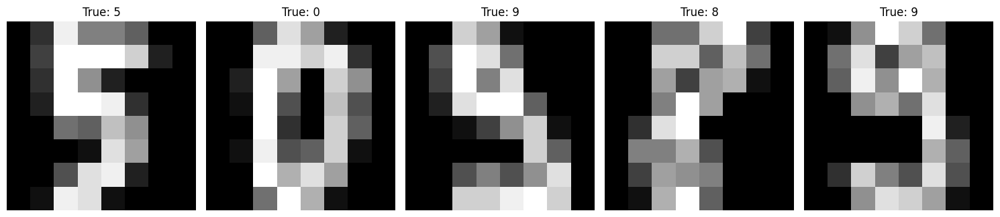

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, ax in enumerate(axes):
    img = x[start_index + i]
    label = y[start_index + i].item()
    ax.imshow(img, cmap='gray')
    ax.set_title(f"True: {label}", fontsize=12, color='black')
    ax.axis('off')
plt.tight_layout()
plt.show()

## Preprocess the dataset

In [ ]:
# Reshape arrays
x_reshaped = x.reshape((x.shape[0], 8, 8, 1))

# Standardize data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_reshaped.reshape(x_reshaped.shape[0], -1)).reshape(x_reshaped.shape)

# One-hot encode the labels/targets
encoder = OneHotEncoder(sparse_output=False)
y_one_hot = encoder.fit_transform(y.reshape(-1, 1))

# Train-test split data
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y_one_hot, test_size=0.2, random_state=42, stratify=y)

# Display the shapes of the processed data
print(f"X_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (1437, 8, 8, 1)
y_train shape: (1437, 10)
X_test shape: (360, 8, 8, 1)
y_test shape: (360, 10)


## Train a base model

In [ ]:
def get_model():
  input_layer = Input(shape=(8, 8, 1))

  conv1 = Conv2D(16, kernel_size=(3, 3), activation='relu')(input_layer)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
  conv2 = Conv2D(32, kernel_size=(3, 3), activation='relu')(pool1)

  flatten = Flatten()(conv2)
  dense1 = Dense(32, activation='relu')(flatten)
  output_layer = Dense(10, activation='softmax')(dense1)

  model = Model(inputs=input_layer, outputs=output_layer)

  return model

In [ ]:
model = get_model()
batch_size = 32
epochs = 10

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
print("Approximate batches in test: {:.2f}".format(x_test.shape[0] / batch_size))

Approximate batches in test: 11.25


In [ ]:
# Let's see where the model went wrong to plot the best images
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)
incorrect_indices = np.where(y_pred_classes != y_true_classes)[0]
print("Indices of incorrect predictions:", incorrect_indices)

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Indices of incorrect predictions: [ 36  51  76  87 115 127 140 148 168 214 228 276 281]


## Test the accuracy of the base model

In [ ]:
batch_size = 32

total_predicted = 0
total_correct = 0
batch_num = 0

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

num_batches = int(np.ceil(len(x_test_limited) / batch_size))

with tqdm(total=num_batches, desc="Processing images", unit="batch") as pbar:
    for i in range(0, len(x_test_limited), batch_size):
        batch_images = x_test_limited[i:i + batch_size]
        batch_labels = y_test_limited[i:i + batch_size]

        # Get model predictions for the batch
        train_pred = model.predict_on_batch(batch_images)
        predicted_classes = np.argmax(train_pred, axis=1)
        true_classes = np.argmax(batch_labels, axis=1)

        # Count the number of correct predictions
        num_correct = np.sum(predicted_classes == true_classes)
        total_predicted += len(batch_labels)
        total_correct += num_correct
        current_accuracy = 100.0 * total_correct / total_predicted

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "Accuracy": f"{current_accuracy:.2f}%",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)
        batch_num += 1

# Print final accuracy
print(f"\nFinal Accuracy: {100.0 * total_correct / total_predicted:.2f}% from {total_predicted} samples")

Processing images: 100%|██████████| 2/2 [00:00<00:00,  2.42batch/s, Batch No.=2, Accuracy=100.00%, Total Images Processed=50]


Final Accuracy: 100.00% from 50 samples


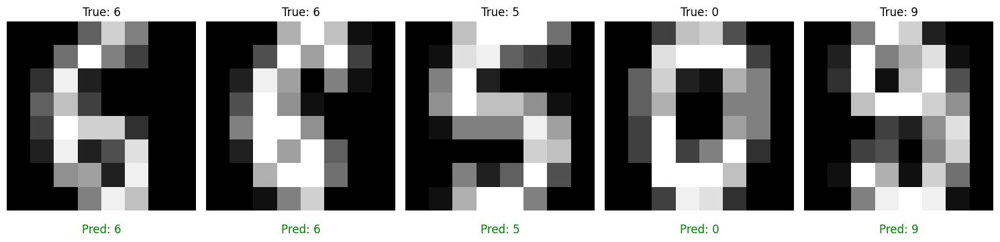

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)
    predicted_label = np.argmax(pred, axis=1)[0]

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if predicted_label == true_label else 'red'

    # show unprocessed image by reverse scaling it
    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)

    # Plot the image
    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Add predicted label just below the true label, colored accordingly
    axes[i - start_index].annotate(f"Pred: {predicted_label}",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

## Algorithms

### Transductive CP

#### $\alpha$ = 0.01

In [ ]:
total_predicted = 0
top1_correct = 0
top5_correct = 0
coverage_correct = 0
total_set_size = 0

batch_num = 0
alpha = 0.01 #0.05
num_classes = 10
batch_size = 32
epochs = 10

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

with tqdm(desc="Processing images", unit="image") as pbar:
    for test_idx in range(len(x_test_limited)):
        x_test_point = x_test_limited[test_idx].reshape(1, 8, 8, 1)
        true_label = np.argmax(y_test_limited[test_idx])

        # Loop over all candidate labels (0 to num_classes - 1)
        prediction_set = []
        for candidate_label in range(num_classes):
            # Augment the training set with the test point and candidate label
            x_train_aug = np.vstack([x_train, x_test_point])
            y_train_aug = np.vstack([y_train, tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes)])

            # Fit a new model on the augmented dataset
            model_aug = get_model()
            model_aug.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
            model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

            # no need to reuse code
            def compute_nonconformity_score(model, x, y):
              predictions = model.predict(x, verbose=0)
              true_class_indices = np.argmax(y, axis=1)
              true_class_probs = predictions[np.arange(len(predictions)), true_class_indices]
              nonconformity_scores = 1 - true_class_probs
              return nonconformity_scores

            # Get nonconform score on dataset and then on test point
            nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
            q_hat = np.quantile(nonconformity_scores, (1 - alpha))
            test_point_nonconformity = compute_nonconformity_score(model_aug, x_test_point,
                                                                   tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes))

            # Check if the candidate label should be included in the prediction set
            if test_point_nonconformity <= q_hat:
                prediction_set.append(candidate_label)

        # Sort the prediction set
        sorted_prediction_set = prediction_set

        # Metrics
        total_predicted += 1
        total_set_size += len(sorted_prediction_set)

        if true_label in sorted_prediction_set[:1]:
            top1_correct += 1
        if true_label in sorted_prediction_set[:5]:
            top5_correct += 1
        if true_label in sorted_prediction_set:
            coverage_correct += 1

        # Progress bar and metrics update
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        pbar.set_postfix({
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Final metrics
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 50image [38:50, 46.61s/image, Top-1 Accuracy=92.00%, Top-5 Accuracy=100.00%, Coverage=100.00%, Avg Set Size=1.14, Total Images Processed=50]


Final Top-1 Accuracy: 92.00%

Final Top-5 Accuracy: 100.00%

Final Coverage: 100.00%

Final Average Set Size: 1.14


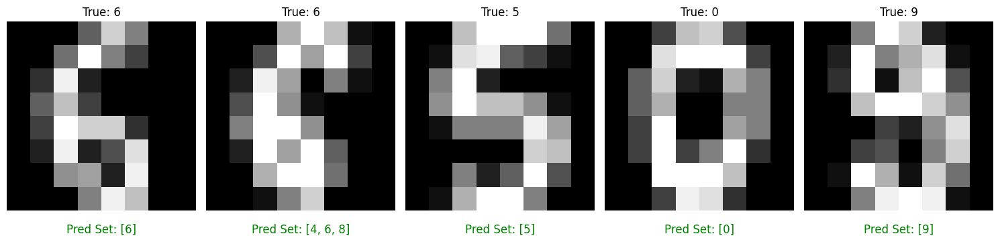

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples
num_classes = 10
batch_size = 32
epochs = 10
alpha = 0.01 #0.05

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Run TCP for this specific image
    prediction_set = []
    for candidate_label in range(num_classes):
        x_train_aug = np.vstack([x_train, img_preprocessed])
        y_train_aug = np.vstack([y_train, tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes)])

        model_aug = get_model()
        model_aug.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        def compute_nonconformity_score(model, x, y):
          predictions = model.predict(x, verbose=0)
          true_class_indices = np.argmax(y, axis=1)
          true_class_probs = predictions[np.arange(len(predictions)), true_class_indices]
          nonconformity_scores = 1 - true_class_probs
          return nonconformity_scores

        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, (1 - alpha))
        test_point_nonconformity = compute_nonconformity_score(model_aug, img_preprocessed, tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes))

        if test_point_nonconformity <= q_hat:
            prediction_set.append(candidate_label)

    # Plot the image
    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)  # Reverse scaling

    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, prediction_set))
    # Color the prediction set label according to whether it contains the true label
    color = 'green' if true_label in prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

### Cross CP

#### $\alpha = 0.01, k=5$

In [ ]:
total_predicted = 0
top1_correct = 0
top5_correct = 0
coverage_correct = 0
total_set_size = 0

batch_num = 0
alpha = 0.01
num_classes = 10
batch_size = 32
epochs = 10
k_folds = 5

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

kf = KFold(n_splits=k_folds, shuffle=True)

with tqdm(desc="Processing images", unit="image") as pbar:
    for test_idx in range(len(x_test_limited)):
        x_test_point = x_test_limited[test_idx].reshape(1, 8, 8, 1)
        true_label = np.argmax(y_test_limited[test_idx])

        prediction_sets_per_fold = []

        # K-Fold Cross Validation
        for train_index, val_index in kf.split(x_train):
            x_train_fold, x_val_fold = x_train[train_index], x_train[val_index]
            y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

            # Train model on the current fold
            model = get_model()
            model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
            model.fit(x_train_fold, y_train_fold, epochs=epochs, batch_size=batch_size, verbose=0)

            def compute_nonconformity_score(model, x, y):
              predictions = model.predict(x, verbose=0)
              true_class_indices = np.argmax(y, axis=1)
              true_class_probs = predictions[np.arange(len(predictions)), true_class_indices]
              nonconformity_scores = 1 - true_class_probs
              return nonconformity_scores

            # Get nonconformity score on the validation fold
            nonconformity_scores = compute_nonconformity_score(model, x_val_fold, y_val_fold)

            # Loop over all candidate labels
            fold_prediction_set = []
            for candidate_label in range(num_classes):
                test_point_nonconformity = compute_nonconformity_score(model, x_test_point, tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes))

                # Check if the candidate label should be included in the prediction set
                q_hat = np.quantile(nonconformity_scores, 1 - alpha)
                if test_point_nonconformity <= q_hat:
                    fold_prediction_set.append(candidate_label)

            # Store the prediction set for this fold
            prediction_sets_per_fold.append(set(fold_prediction_set))

        # Get pred sets
        final_prediction_set = set.intersection(*prediction_sets_per_fold)
        sorted_prediction_set = sorted(final_prediction_set)

        # Metrics
        total_predicted += 1
        total_set_size += len(sorted_prediction_set)

        if true_label in sorted_prediction_set[:1]:
            top1_correct += 1
        if true_label in sorted_prediction_set[:5]:
            top5_correct += 1
        if true_label in sorted_prediction_set:
            coverage_correct += 1

        # Update progress bar and metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        pbar.set_postfix({
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Final metrics
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 50image [20:27, 24.55s/image, Top-1 Accuracy=96.00%, Top-5 Accuracy=98.00%, Coverage=98.00%, Avg Set Size=1.04, Total Images Processed=50]


Final Top-1 Accuracy: 96.00%

Final Top-5 Accuracy: 98.00%

Final Coverage: 98.00%

Final Average Set Size: 1.04


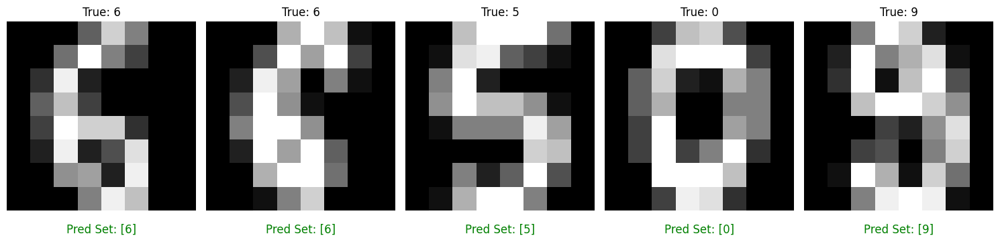

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples
num_classes = 10
batch_size = 32
epochs = 10
alpha = 0.01
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True)

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    prediction_sets_per_fold = []
    for train_index, val_index in kf.split(x_train):
        x_train_fold, x_val_fold = x_train[train_index], x_train[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

        # Train the model on the current fold
        model = get_model()
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
        model.fit(x_train_fold, y_train_fold, epochs=epochs, batch_size=batch_size, verbose=0)

        def compute_nonconformity_score(model, x, y):
          predictions = model.predict(x, verbose=0)
          true_class_indices = np.argmax(y, axis=1)
          true_class_probs = predictions[np.arange(len(predictions)), true_class_indices]
          nonconformity_scores = 1 - true_class_probs
          return nonconformity_scores

        # Get nonconformity scores on the validation fold
        nonconformity_scores = compute_nonconformity_score(model, x_val_fold, y_val_fold)

        # Loop over all candidate labels
        fold_prediction_set = []
        for candidate_label in range(num_classes):
            # Compute the nonconformity score for the test point with this candidate label
            test_point_nonconformity = compute_nonconformity_score(
                model, img_preprocessed, tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes)
            )

            # Check if the candidate label should be included in the prediction set for this fold
            q_hat = np.quantile(nonconformity_scores, 1 - alpha)
            if test_point_nonconformity <= q_hat:
                fold_prediction_set.append(candidate_label)

        # Add the prediction set for the fold to the list
        prediction_sets_per_fold.append(set(fold_prediction_set))

    # Aggregate the prediction sets across all folds by taking the intersection
    final_prediction_set = set.intersection(*prediction_sets_per_fold)
    sorted_prediction_set = sorted(final_prediction_set)

    # Plot the image
    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)  # Reverse scaling

    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, sorted_prediction_set))
    # Color the prediction set label according to whether it contains the true label
    color = 'green' if true_label in sorted_prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

### Approximate CP

#### $α = 0.01$

In [ ]:
# Compute gradients for each training sample to approximate the Hessian and inverse
def compute_hessian_inverse_approx_diagonal(base_model, x_train, y_train):
    """
    Computes an approximate diagonal inverse Hessian matrix.
    This is a memory-efficient alternative to the full Hessian approximation.
    """
    # Initialize a list to store the diagonal entries
    hessian_diag = None

    # Iterate over the training data in batches to compute gradients
    for i in range(len(x_train)):
        with tf.GradientTape() as tape:
            # Forward pass and loss computation for each training point
            prediction = base_model(x_train[i:i+1], training=False)
            loss = tf.keras.losses.categorical_crossentropy(y_train[i:i+1], prediction)

        # Compute the gradient of the loss with respect to model parameters
        gradient = tape.gradient(loss, base_model.trainable_weights)
        flat_gradient = tf.concat([tf.reshape(g, [-1]) for g in gradient], axis=0)

        # Compute squared gradient (approximation to diagonal Hessian)
        if hessian_diag is None:
            hessian_diag = tf.square(flat_gradient)
        else:
            hessian_diag += tf.square(flat_gradient)

    # Average over the training set
    hessian_diag /= len(x_train)

    # Invert the diagonal to approximate the inverse Hessian
    hessian_inv_diag = 1.0 / (hessian_diag + 1e-5)  # Add small epsilon for numerical stability

    return hessian_inv_diag

# Influence score calculation using precomputed Hessian inverse
def compute_indirect_influence_score(test_point, candidate_label, base_model, hessian_inv_diag, num_classes=10):
    """
    Computes the indirect influence score for a candidate label on a test point
    by approximating the model parameters' adjustment due to adding or removing points.
    """
    candidate_label_one_hot = tf.keras.utils.to_categorical([candidate_label], num_classes=num_classes)

    # Compute gradient for the test point with candidate label
    with tf.GradientTape() as tape:
        prediction = base_model(test_point, training=False)
        loss = tf.keras.losses.categorical_crossentropy(candidate_label_one_hot, prediction)

    test_gradient = tape.gradient(loss, base_model.trainable_weights)
    flat_test_gradient = tf.concat([tf.reshape(g, [-1]) for g in test_gradient], axis=0)
    hessian_inv_diag = tf.reshape(hessian_inv_diag, [-1])

    # Indirect influence on parameters: θ̃ ≈ θ + H⁻¹ * test_gradient
    parameter_adjustment = hessian_inv_diag * flat_test_gradient

    # Compute approximate nonconformity score based on the adjusted parameters
    adjusted_loss = tf.reduce_sum(parameter_adjustment * flat_test_gradient)

    return float(adjusted_loss)

In [ ]:
total_predicted = 0
top1_correct = 0
top5_correct = 0
coverage_correct = 0
total_set_size = 0

alpha = 0.01
num_classes = 10
batch_size = 32
epochs = 10

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

base_model = get_model()
base_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
base_model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

hessian_inv_approx = compute_hessian_inverse_approx_diagonal(base_model, x_train, y_train)

with tqdm(desc="Processing images", unit="image") as pbar:
    for test_idx in range(len(x_test_limited)):
        x_test_point = x_test_limited[test_idx].reshape(1, 8, 8, 1)
        true_label = np.argmax(y_test_limited[test_idx])

        # Generate the prediction set based on ACP
        prediction_set = []

        for candidate_label in range(num_classes):
            test_nonconformity_score = compute_indirect_influence_score(x_test_point, candidate_label, base_model, hessian_inv_approx)

            num_greater_equal = 0
            for i in range(len(x_train)):
                train_nonconformity_score = compute_indirect_influence_score(x_train[i:i+1], np.argmax(y_train[i]), base_model, hessian_inv_approx)
                if train_nonconformity_score >= test_nonconformity_score:
                    num_greater_equal += 1

            p_value = num_greater_equal / (len(x_train) + 1)
            if p_value > alpha:
                prediction_set.append(candidate_label)
        sorted_prediction_set = prediction_set

        # Metrics
        total_predicted += 1
        total_set_size += len(sorted_prediction_set)
        if true_label in sorted_prediction_set[:1]:
            top1_correct += 1
        if true_label in sorted_prediction_set[:5]:
            top5_correct += 1
        if true_label in sorted_prediction_set:
            coverage_correct += 1

        # Update progress bar and metrics
        pbar.set_postfix({
            "Top-1 Accuracy": f"{100.0 * top1_correct / total_predicted:.2f}%",
            "Top-5 Accuracy": f"{100.0 * top5_correct / total_predicted:.2f}%",
            "Coverage": f"{100.0 * coverage_correct / total_predicted:.2f}%",
            "Avg Set Size": f"{total_set_size / total_predicted:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Final metrics
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"Final Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"Final Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"Final Average Set Size: {total_set_size / total_predicted:.2f}")

Processing images: 0image [01:05, ?image/s]


KeyboardInterrupt: 

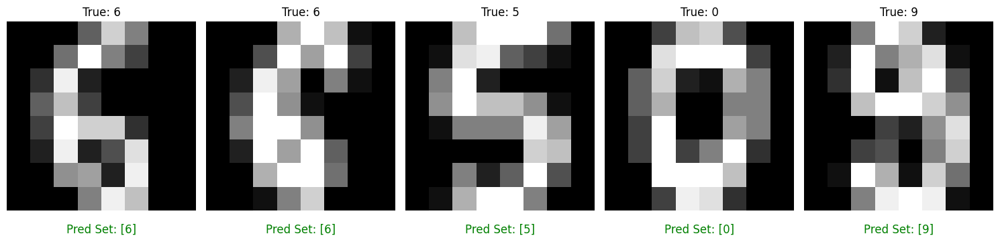

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples
num_classes = 10
alpha = 0.01  # Significance level

# Compute the approximate inverse Hessian diagonal
hessian_inv_diag = compute_hessian_inverse_approx_diagonal(base_model, x_train, y_train)

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Initialize prediction set for this test image
    prediction_set = []

    # Compute the prediction set using ACP for this specific image
    for candidate_label in range(num_classes):
        # Compute the nonconformity score for the test point with this candidate label
        test_nonconformity_score = compute_indirect_influence_score(img_preprocessed, candidate_label, base_model, hessian_inv_diag)

        # Calculate the p-value by comparing the test score with training scores
        num_greater_equal = 0
        for j in range(len(x_train)):
            train_nonconformity_score = compute_indirect_influence_score(x_train[j:j+1], np.argmax(y_train[j]), base_model, hessian_inv_diag)
            if train_nonconformity_score >= test_nonconformity_score:
                num_greater_equal += 1

        p_value = num_greater_equal / (len(x_train) + 1)

        # If the p-value is greater than alpha, include the candidate label in the prediction set
        if p_value > alpha:
            prediction_set.append(candidate_label)

    # Plot the image
    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)  # Reverse scaling

    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, prediction_set))
    color = 'green' if true_label in prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

# Split Conformal Prediction

## Load the dataset

Choose a way to login and load the dataset

### Login with interface

In [ ]:
from huggingface_hub import login
login()

In [ ]:
dataset_test = load_dataset("ILSVRC/imagenet-1k", split="validation", streaming=True)
dataset_calibration = load_dataset("ILSVRC/imagenet-1k", split="train", streaming=True)
label_map = dataset_test.features["label"].int2str

### Login with token

In [ ]:
dataset_test = load_dataset("ILSVRC/imagenet-1k", split="validation", token='', trust_remote_code=True, streaming=True)
dataset_calibration = load_dataset("ILSVRC/imagenet-1k", split="train", token='', trust_remote_code=True, streaming=True)
label_map = dataset_test.features["label"].int2str

README.md:   0%|          | 0.00/85.4k [00:00<?, ?B/s]

imagenet-1k.py:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

classes.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

### Visualise the dataset

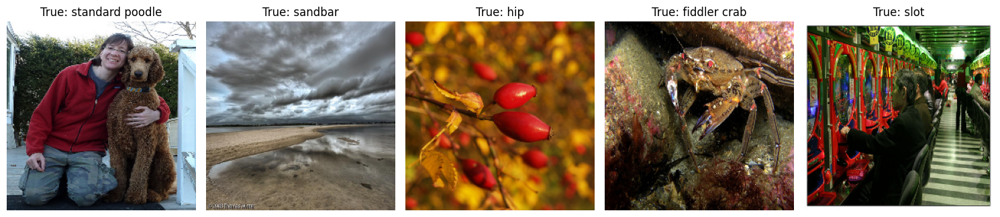

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']
    label = label_map(example['label']).split(',')[0]
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {label}", fontsize=12, color='black')
    axes[i].axis('off')
plt.tight_layout()
plt.show()

## Preprocess the dataset

In [ ]:
image_shape = (224, 224, 3)
batch_size = 128
total_samples = 50000  # tot num of samples in the dataset
calibration_samples = 10000  # 10,000 for calibration
test_samples = total_samples - calibration_samples  # 40,000 for test


def preprocess_example(example):
    # Load and preprocess the image
    img = img_to_array(example['image'])

    # Convert single-channel or 4-channel images to RGB (3 channels)
    if img.shape[2] == 1:  # Grayscale
        img = np.dstack([img] * 3)
    elif img.shape[2] == 4:  # RGBA
        img = img[..., :3]

    # Resize and preprocess the image
    img = tf.image.resize(img, image_shape[:2])
    img = preprocess_input(img)

    return img, example['label']

# Create the test dataset
def test_generator():
    total_samples_processed = 0
    for example in dataset_test:
        if total_samples_processed >= test_samples:
            break
        img, label = preprocess_example(example)
        yield img, label
        total_samples_processed += 1

test_dataset = tf.data.Dataset.from_generator(
    test_generator,
    output_signature=(
        tf.TensorSpec(shape=image_shape, dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.int64)
    )
).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Create the calibration dataset
def calibration_generator():
    total_samples_processed = 0
    for example in dataset_calibration:
        if total_samples_processed >= calibration_samples:
            break
        img, label = preprocess_example(example)
        yield img, label
        total_samples_processed += 1

calibration_dataset = tf.data.Dataset.from_generator(
    calibration_generator,
    output_signature=(
        tf.TensorSpec(shape=image_shape, dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.int64)
    )
).batch(batch_size).prefetch(tf.data.AUTOTUNE)

## Test the accuracy of the base model

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')

574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
print("Approximate batches: {:.2f}".format(test_samples/batch_size))

Approximate batches: 312.50


In [ ]:
total_predicted = 0
total_correct = 0
batch_num = 0

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # get model predictions
        train_pred = model.predict_on_batch(batch_images)
        predicted_classes = np.argmax(train_pred, axis=1)
        num_correct = np.count_nonzero(predicted_classes == batch_labels)

        # update tqdm counters and calc accuracy
        total_predicted += len(batch_labels)
        total_correct += num_correct
        current_accuracy = 100.0 * total_correct / total_predicted

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Accuracy": f"{current_accuracy:.2f}%",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# print accuracy
print(f"\nFinal Accuracy: {100.0 * total_correct / total_predicted:.2f}% from {total_predicted} samples")

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted label
    true_label = example['label']
    true_label_name = label_map(true_label)

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)
    predicted_label = int(np.argmax(pred, axis=1)[0])  # Get the predicted class index
    predicted_label_name = label_map(predicted_label)
    predicted_label_name = predicted_label_name.split(',')[0] if ',' in predicted_label_name else predicted_label_name

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if predicted_label == true_label else 'red'

    axes[i].imshow(img)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')

    # Add predicted label just below the true label, colored accordingly
    axes[i].annotate(f"Pred: {predicted_label_name}",
                     xy=(0.5, -0.1), xycoords='axes fraction',
                     ha='center', va='center',
                     fontsize=12, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Algorithms

### Inductive CP

#### $\alpha$ = 0.05

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [02:31,  1.92s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Prediction set
            prediction_set = np.where(preds >= 1 - q_hat)[0]
            total_set_size += len(prediction_set)

            # Sort the prediction set
            sorted_prediction_set = prediction_set[np.argsort(-preds[prediction_set])]

            # Top-1, 5, & 10 accuracy: Is the true label in the top-1, 5, & 10 classes of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check, is the class in the pred set at all?
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [23:05,  4.43s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=86.11%, Top-10 Accuracy=89.71%, Coverage=91.05%, Avg Set Size=5.74, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 86.11%

Final Top-10 Accuracy: 89.71%

Final Coverage: 91.05%

Final Average Set Size: 5.74


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.9899798035621643


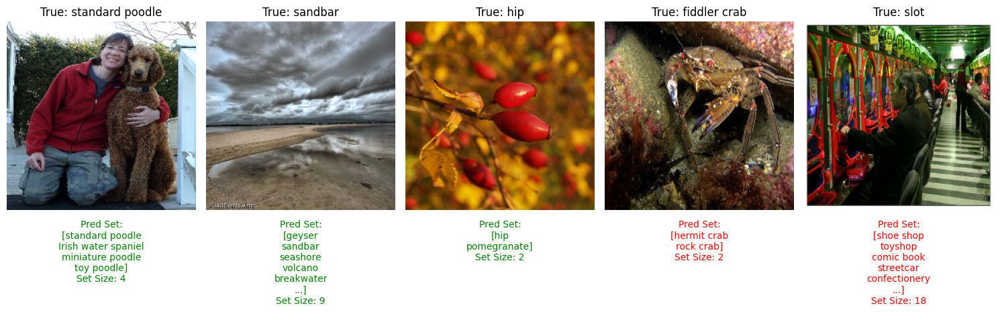

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Modified line

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities and compute cumulative sums
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]
    cumulative_sums = np.cumsum(sorted_probs)

    # Find the et of labels where cumulative sum >= 1 - q_hat
    prediction_set_indices = np.where(pred >= 1 - q_hat)[0]
    sorted_prediction_set = prediction_set_indices[np.argsort(-pred[prediction_set_indices])]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in sorted_prediction_set]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

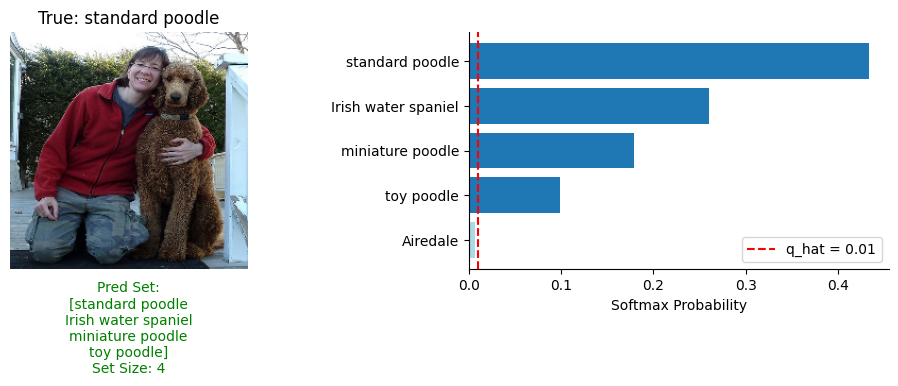

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities (NO cumulative sum)
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]  # Sorted softmax probabilities

    # Find the minimal set of labels where individual probability >= (1 - q_hat)
    prediction_set_indices = np.where(pred >= 1 - q_hat)[0]
    sorted_prediction_set = prediction_set_indices[np.argsort(-pred[prediction_set_indices])]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in sorted_prediction_set]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Get top k raw probabilities
    top_k = 5
    top_indices = sorted_indices[:top_k]
    top_probs = sorted_probs[:top_k]  # FIXED: Using raw softmax probabilities
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_probs, color=bar_colors)  # FIXED: Using raw probabilities
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Softmax Probability')  # FIXED: More accurate label

    # Visualize q_hat threshold
    ax[1].axvline(1 - q_hat, color='red', linestyle='--', label=f'q_hat = {1 - q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\alpha$ = 0.1

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.1

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.1
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Prediction set
            prediction_set = np.where(preds >= 1 - q_hat)[0]
            total_set_size += len(prediction_set)

            # Sort the prediction set
            sorted_prediction_set = prediction_set[np.argsort(-preds[prediction_set])]

            # Top-1, 5, & 10 accuracy: Is the true label in the top-1, 5, & 10 classes of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check, is the class in the pred set at all?
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [15:31,  2.97s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=83.63%, Top-10 Accuracy=84.25%, Coverage=84.25%, Avg Set Size=2.60, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 83.63%

Final Top-10 Accuracy: 84.25%

Final Coverage: 84.25%

Final Average Set Size: 2.60


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.9600020051002502


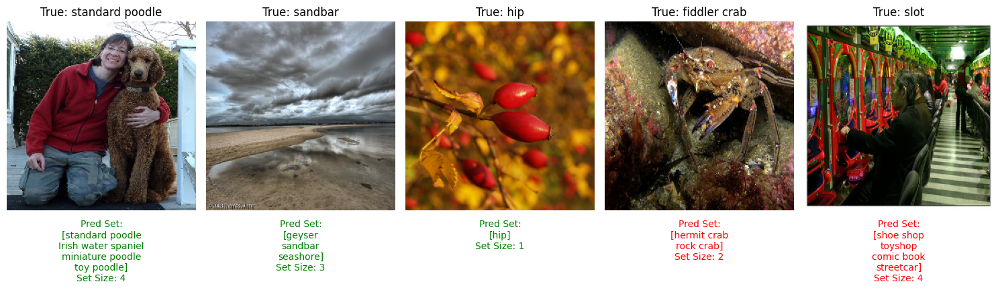

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Modified line

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities and compute cumulative sums
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]
    cumulative_sums = np.cumsum(sorted_probs)

    # Find the et of labels where cumulative sum >= 1 - q_hat
    prediction_set_indices = np.where(pred >= 1 - q_hat)[0]
    sorted_prediction_set = prediction_set_indices[np.argsort(-pred[prediction_set_indices])]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in sorted_prediction_set]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

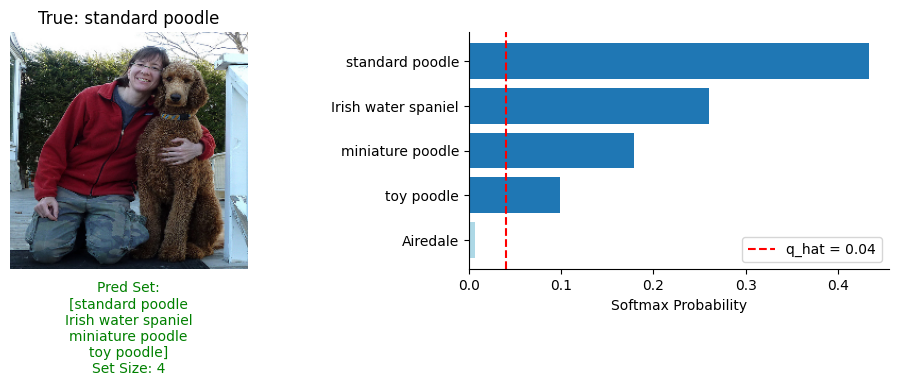

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities (NO cumulative sum)
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]  # Sorted softmax probabilities

    # Find the minimal set of labels where individual probability >= (1 - q_hat)
    prediction_set_indices = np.where(pred >= 1 - q_hat)[0]
    sorted_prediction_set = prediction_set_indices[np.argsort(-pred[prediction_set_indices])]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in sorted_prediction_set]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Get top k raw probabilities
    top_k = 5
    top_indices = sorted_indices[:top_k]
    top_probs = sorted_probs[:top_k]  # FIXED: Using raw softmax probabilities
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_probs, color=bar_colors)  # FIXED: Using raw probabilities
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Softmax Probability')  # FIXED: More accurate label

    # Visualize q_hat threshold
    ax[1].axvline(1 - q_hat, color='red', linestyle='--', label=f'q_hat = {1 - q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

### APS

#### $\alpha$ = 0.05

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [03:08,  2.39s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # Find the smallest prediction set where cumulative_prob >= q_hat
            prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
            sorted_prediction_set = sorted_indices[:prediction_set_size]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [13:30,  2.59s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=86.51%, Top-10 Accuracy=90.83%, Coverage=98.11%, Avg Set Size=75.11, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 86.51%

Final Top-10 Accuracy: 90.83%

Final Coverage: 98.11%

Final Average Set Size: 75.11


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.9899798035621643


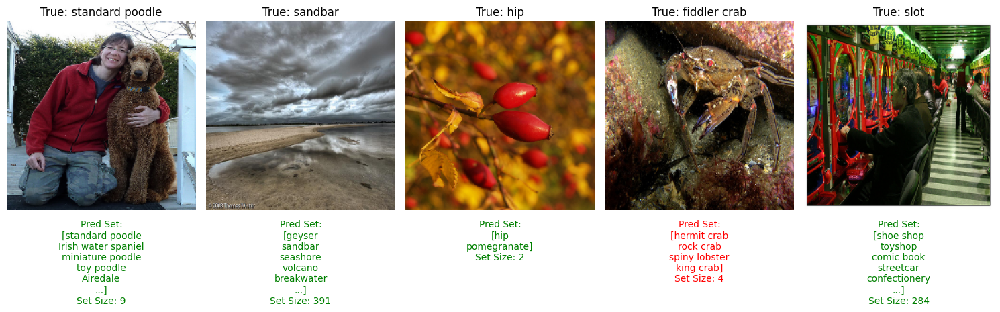

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Modified line to get label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]
    cumulative_probs = np.cumsum(sorted_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, 100)]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

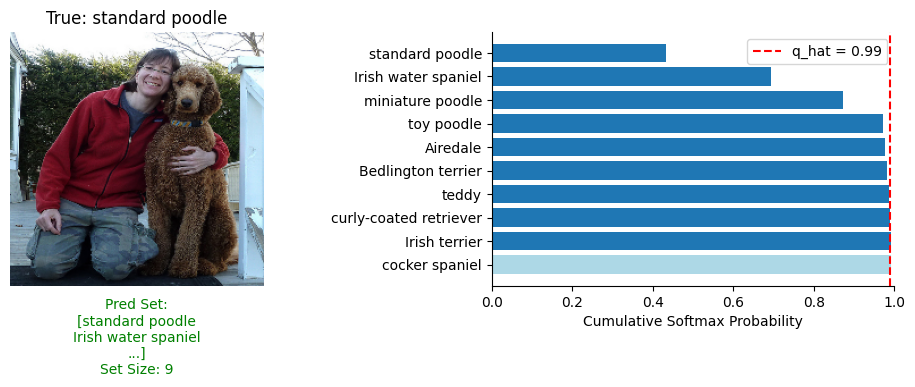

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities and compute cumulative sums
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]
    cumulative_probs = np.cumsum(sorted_probs)  # Compute cumulative softmax probabilities

    # Find the smallest prediction set where cumulative_prob >= q_hat (for APS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

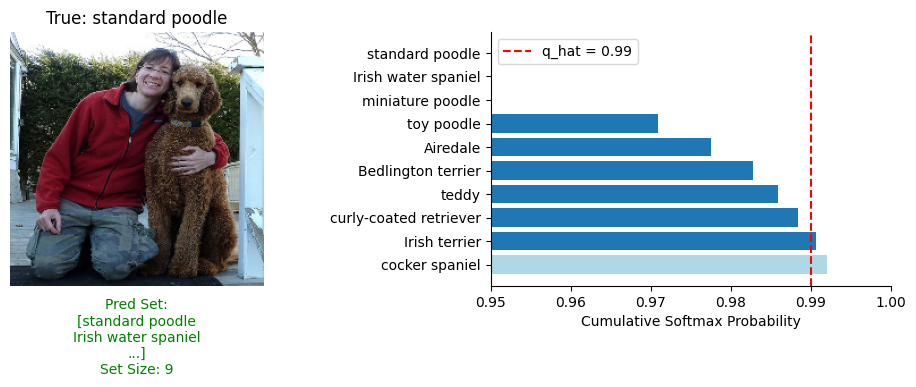

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities and compute cumulative sums
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]
    cumulative_probs = np.cumsum(sorted_probs)  # Compute cumulative softmax probabilities

    # Find the smallest prediction set where cumulative_prob >= q_hat (for APS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0.95, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\alpha$ = 0.1

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.1

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [02:48,  2.13s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.1
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # Find the smallest prediction set where cumulative_prob >= q_hat
            prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
            sorted_prediction_set = sorted_indices[:prediction_set_size]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [12:19,  2.36s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=85.80%, Top-10 Accuracy=89.73%, Coverage=95.55%, Avg Set Size=31.45, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 85.80%

Final Top-10 Accuracy: 89.73%

Final Coverage: 95.55%

Final Average Set Size: 31.45


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.9600020051002502


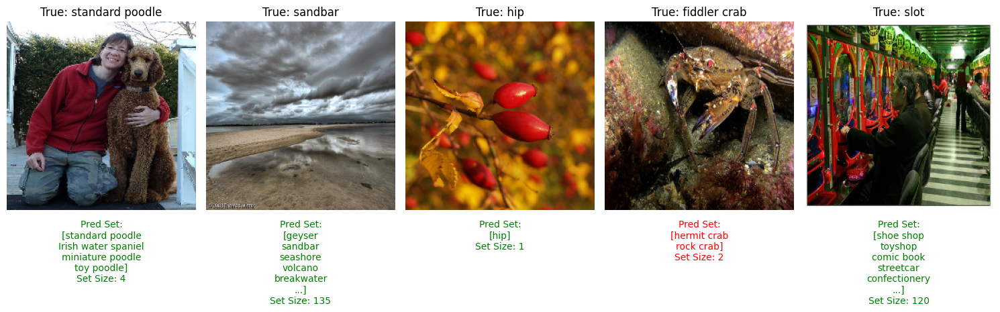

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Modified line to get label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]
    cumulative_probs = np.cumsum(sorted_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, 100)]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

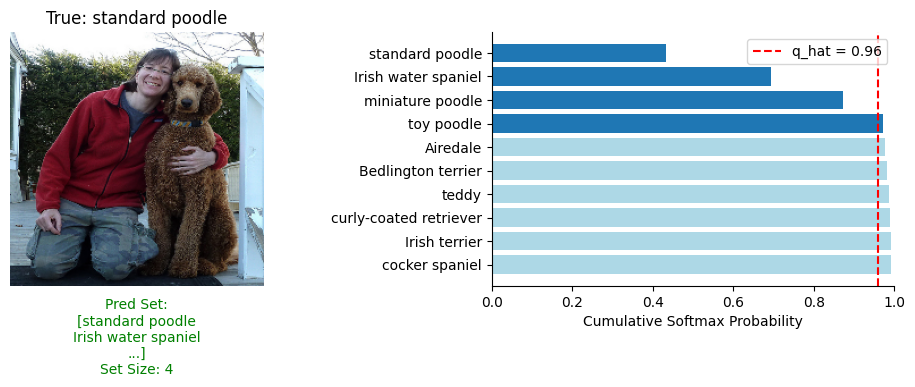

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities and compute cumulative sums
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]
    cumulative_probs = np.cumsum(sorted_probs)  # Compute cumulative softmax probabilities

    # Find the smallest prediction set where cumulative_prob >= q_hat (for APS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

### RAPS

#### $\alpha$ = 0.05

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [03:25,  2.60s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05
lambda_reg = 0.001
k_reg = 5

# construct q_hat
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

# Construct regularization vector
num_classes = 1000
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # RAPS adjustment: Apply regularization to sorted predictions
            sorted_preds_reg = sorted_preds + reg_vec.squeeze()
            sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

            # Use q_hat and cumulative probabilities to determine the prediction set
            _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
            sorted_prediction_set = sorted_indices[_ind]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [11:29,  2.20s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=86.51%, Top-10 Accuracy=90.80%, Coverage=96.27%, Avg Set Size=21.09, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 86.51%

Final Top-10 Accuracy: 90.80%

Final Coverage: 96.27%

Final Average Set Size: 21.09


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.9899798035621643


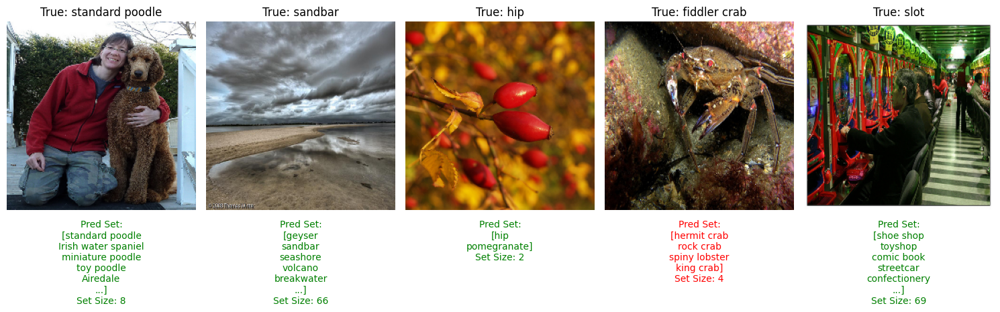

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get human-readable label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_preds)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted predictions
    augmented_preds = sorted_preds + reg_vec

    # Calculate cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, len(sorted_preds))]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

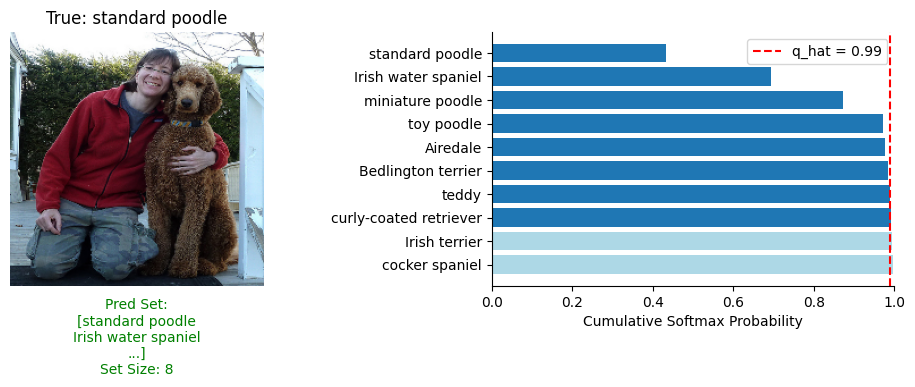

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities by descending confidence
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_probs)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted probabilities
    augmented_probs = sorted_probs + reg_vec

    # Compute cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_probs)

    # Find the smallest prediction set where cumulative_prob >= q_hat (for RAPS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 2 labels for the left side (display set)
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\alpha$ = 0.1

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.1

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [10:32,  8.01s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.1
lambda_reg = 0.001
k_reg = 5

# construct q_hat
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

# Construct regularization vector
num_classes = 1000
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # RAPS adjustment: Apply regularization to sorted predictions
            sorted_preds_reg = sorted_preds + reg_vec.squeeze()
            sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

            # Use q_hat and cumulative probabilities to determine the prediction set
            _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
            sorted_prediction_set = sorted_indices[_ind]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [47:47,  9.16s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=85.79%, Top-10 Accuracy=89.71%, Coverage=94.34%, Avg Set Size=15.62, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 85.79%

Final Top-10 Accuracy: 89.71%

Final Coverage: 94.34%

Final Average Set Size: 15.62


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.960013747215271


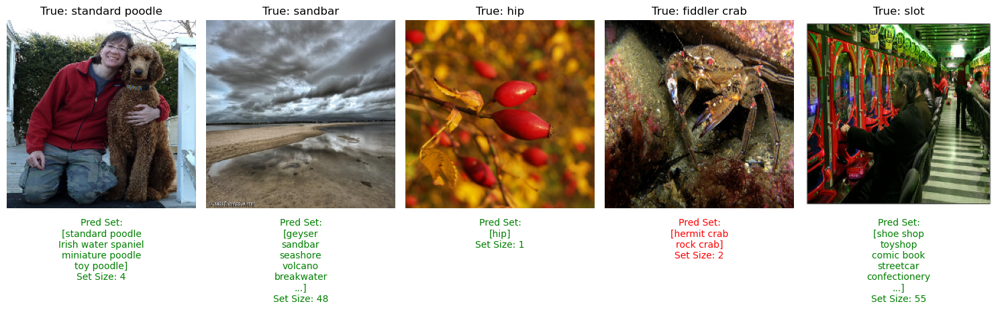

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get human-readable label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_preds)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted predictions
    augmented_preds = sorted_preds + reg_vec

    # Calculate cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, len(sorted_preds))]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

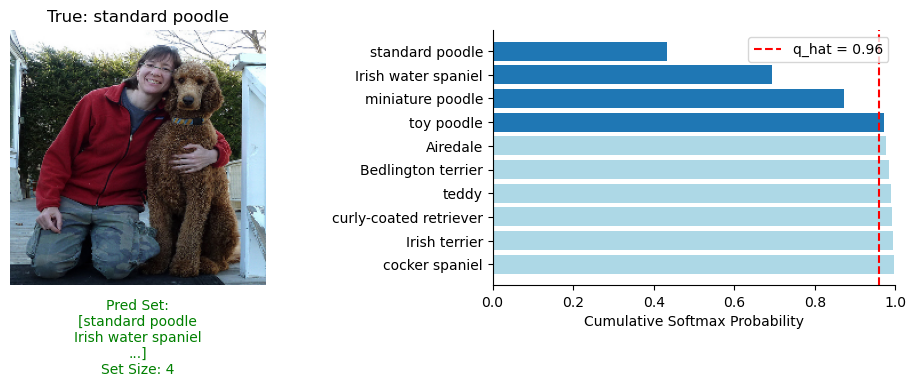

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities by descending confidence
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_probs)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted probabilities
    augmented_probs = sorted_probs + reg_vec

    # Compute cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_probs)

    # Find the smallest prediction set where cumulative_prob >= q_hat (for RAPS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 2 labels for the left side (display set)
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\lambda_{reg}$ = 0.01

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [12:22,  9.40s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05
lambda_reg = 0.01
k_reg = 5

# construct q_hat
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

# Construct regularization vector
num_classes = 1000
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # RAPS adjustment: Apply regularization to sorted predictions
            sorted_preds_reg = sorted_preds + reg_vec.squeeze()
            sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

            # Use q_hat and cumulative probabilities to determine the prediction set
            _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
            sorted_prediction_set = sorted_indices[_ind]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [51:54,  9.95s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=86.50%, Top-10 Accuracy=90.58%, Coverage=93.18%, Avg Set Size=8.79, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 86.50%

Final Top-10 Accuracy: 90.58%

Final Coverage: 93.18%

Final Average Set Size: 8.79


In [ ]:
print("q-hat: {}".format(q_hat))

q-hat: 0.989987313747406


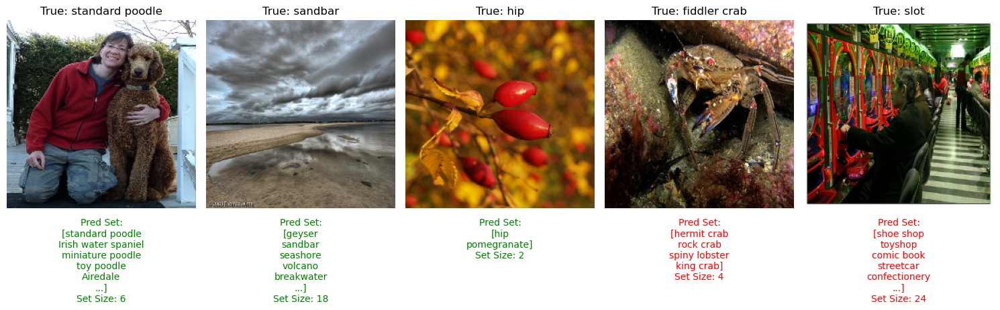

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get human-readable label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_preds)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted predictions
    augmented_preds = sorted_preds + reg_vec

    # Calculate cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, len(sorted_preds))]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

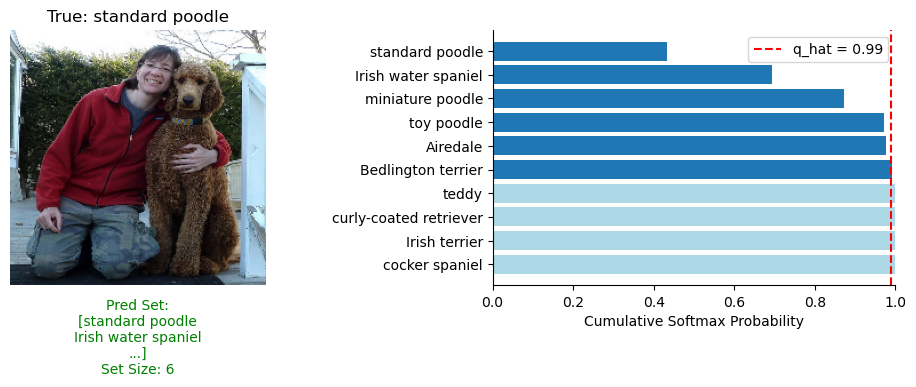

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities by descending confidence
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_probs)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted probabilities
    augmented_probs = sorted_probs + reg_vec

    # Compute cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_probs)

    # Find the smallest prediction set where cumulative_prob >= q_hat (for RAPS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 2 labels for the left side (display set)
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\lambda_{reg}$ = 0.0001

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores = []
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs
        calibration_scores.append(nonconformity_scores)

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 79batch [12:22,  9.40s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05
lambda_reg = 0.0001
k_reg = 5

# construct q_hat
n = len(calibration_scores)
q_level = np.ceil((n + 1) * (1 - alpha)) / n
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

# Construct regularization vector
num_classes = 1000
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        train_pred = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i]
            preds = train_pred[i]

            # Sort predictions by descending confidence
            sorted_indices = np.argsort(-preds)
            sorted_preds = preds[sorted_indices]
            cumulative_probs = np.cumsum(sorted_preds)

            # RAPS adjustment: Apply regularization to sorted predictions
            sorted_preds_reg = sorted_preds + reg_vec.squeeze()
            sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

            # Use q_hat and cumulative probabilities to determine the prediction set
            _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
            sorted_prediction_set = sorted_indices[_ind]

            total_set_size += len(sorted_prediction_set)

            # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1

            # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1

            # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        # Update total counts
        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"\nFinal Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"\nFinal Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [47:08,  9.04s/batch, Batch No.=313, Top-1 Accuracy=66.12%, Top-5 Accuracy=86.50%, Top-10 Accuracy=90.81%, Coverage=97.65%, Avg Set Size=45.35, Total Images Processed=4e+4]


Final Top-1 Accuracy: 66.12%

Final Top-5 Accuracy: 86.50%

Final Top-10 Accuracy: 90.81%

Final Coverage: 97.65%

Final Average Set Size: 45.35


In [ ]:
print("q-hat: {}".format(q_hat))

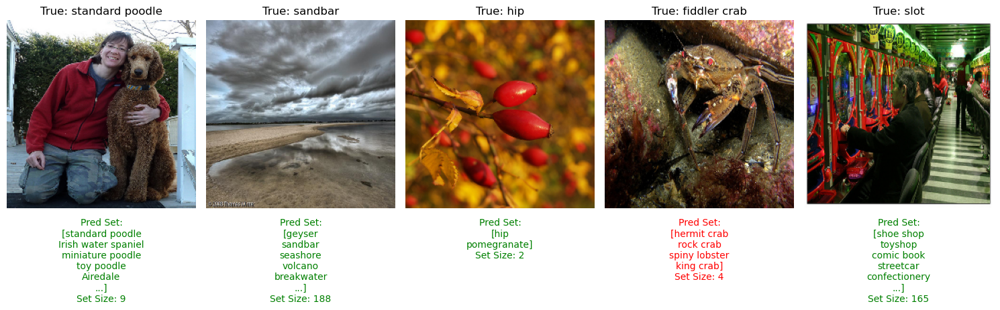

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get human-readable label name

    # Model prediction
    preds = model.predict(img_preprocessed, verbose=0)[0]

    # Sort predictions by descending confidence
    sorted_indices = np.argsort(-preds)
    sorted_preds = preds[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_preds)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted predictions
    augmented_preds = sorted_preds + reg_vec

    # Calculate cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_preds)

    # Find the smallest prediction set where cumulative_prob >= q_hat
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1

    # Get the sorted prediction set
    prediction_set_indices = sorted_indices[:min(prediction_set_size, len(sorted_preds))]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Plot the image and annotate the true and predicted labels
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

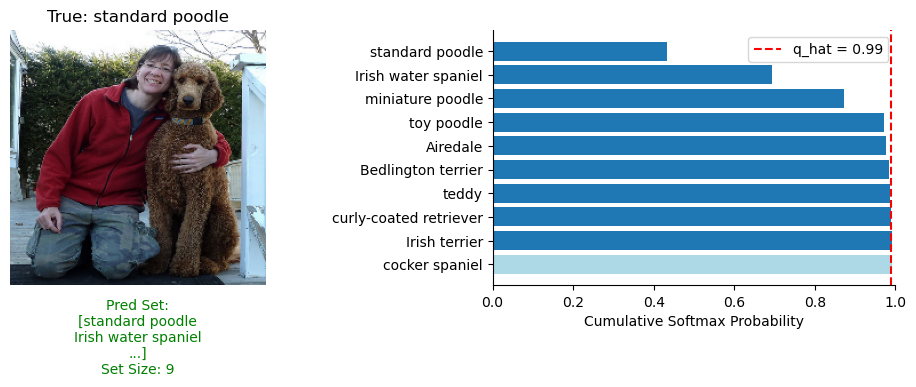

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Sort probabilities by descending confidence
    sorted_indices = np.argsort(-pred)  # Indices of labels sorted by decreasing probability
    sorted_probs = pred[sorted_indices]

    # Construct regularization vector for RAPS
    reg_vec = np.zeros_like(sorted_probs)
    reg_vec[k_reg:] = lambda_reg  # Regularization applied only after k_reg classes

    # Apply regularization to the sorted probabilities
    augmented_probs = sorted_probs + reg_vec

    # Compute cumulative probabilities with regularization
    cumulative_probs = np.cumsum(augmented_probs)

    # Find the smallest prediction set where cumulative_prob >= q_hat (for RAPS CP)
    prediction_set_size = np.searchsorted(cumulative_probs, q_hat) + 1
    prediction_set_indices = sorted_indices[:prediction_set_size]
    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]

    # Limit display to the first 2 labels for the left side (display set)
    display_set = prediction_set_names[:2]
    if len(prediction_set_names) > 2:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    top_k = 10
    top_indices = sorted_indices[:top_k]
    top_cumulative_probs = cumulative_probs[:top_k]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.05), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Show bar chart of top softmax probabilities on the right
    bar_colors = ['tab:blue' if label in prediction_set_names else 'lightblue' for label in top_labels]
    ax[1].barh(top_labels, top_cumulative_probs, color=bar_colors)
    ax[1].invert_yaxis()  # Highest probability at the top
    ax[1].set_xlabel('Cumulative Softmax Probability')
    #ax[1].set_title(f"Top {top_k} Predicted Labels")
    ax[1].set_xlim([0, 1])  # Set the limit to 1 for better scaling

    # Visualize q_hat threshold
    ax[1].axvline(q_hat, color='red', linestyle='--', label=f'q_hat = {q_hat:.2f}')
    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

### MC-CP

In [ ]:
digits = load_digits()
x = digits.images
y = digits.target.reshape(-1, 1)

# Reshape arrays
x_reshaped = x.reshape((x.shape[0], 8, 8, 1))

# Standardize data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_reshaped.reshape(x_reshaped.shape[0], -1)).reshape(x_reshaped.shape)

# One-hot encode the labels/targets
encoder = OneHotEncoder(sparse_output=False)
y_one_hot = encoder.fit_transform(y.reshape(-1, 1))

# Train-test split data
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y_one_hot, test_size=0.2, random_state=42, stratify=y)
x_train, x_cal, y_train, y_cal = train_test_split(x_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

# Display the shapes of the processed data
print(f"X_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"X_cal shape: {x_cal.shape}")
print(f"y_cal shape: {y_cal.shape}")

X_train shape: (1149, 8, 8, 1)
y_train shape: (1149, 10)
X_test shape: (360, 8, 8, 1)
y_test shape: (360, 10)
X_cal shape: (288, 8, 8, 1)
y_cal shape: (288, 10)


In [ ]:
def get_model():
  input_layer = Input(shape=(8, 8, 1))

  conv1 = Conv2D(16, kernel_size=(3, 3), activation='relu')(input_layer)
  drop1 = Dropout(0.1)(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2))(drop1)
  conv2 = Conv2D(32, kernel_size=(3, 3), activation='relu')(pool1)
  drop2 = Dropout(0.1)(conv2)

  flatten = Flatten()(drop2)
  dense1 = Dense(32, activation='relu')(flatten)
  output_layer = Dense(10, activation='softmax')(dense1)

  model = Model(inputs=input_layer, outputs=output_layer)

  return model

model = get_model()
batch_size = 32
epochs = 5

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

Approximate batches in test: 11.25


In [ ]:
batch_size = 32

total_predicted = 0
total_correct = 0
batch_num = 0

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

num_batches = int(np.ceil(len(x_test_limited) / batch_size))

with tqdm(total=num_batches, desc="Processing images", unit="batch") as pbar:
    for i in range(0, len(x_test_limited), batch_size):
        batch_images = x_test_limited[i:i + batch_size]
        batch_labels = y_test_limited[i:i + batch_size]

        # Get model predictions for the batch
        train_pred = model.predict_on_batch(batch_images)
        predicted_classes = np.argmax(train_pred, axis=1)
        true_classes = np.argmax(batch_labels, axis=1)

        # Count the number of correct predictions
        num_correct = np.sum(predicted_classes == true_classes)
        total_predicted += len(batch_labels)
        total_correct += num_correct
        current_accuracy = 100.0 * total_correct / total_predicted

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "Accuracy": f"{current_accuracy:.2f}%",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)
        batch_num += 1

# Print final accuracy
print(f"\nFinal Accuracy: {100.0 * total_correct / total_predicted:.2f}% from {total_predicted} samples")

Processing images: 100%|██████████| 2/2 [00:00<00:00, 283.25batch/s, Batch No.=2, Accuracy=94.00%, Total Images Processed=50]


Final Accuracy: 94.00% from 50 samples


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
calibration_scores = []
alpha = 0.01

x_cal_limited = x_cal[:50]
y_cal_limited = y_cal[:50]

with tqdm(desc="Calibrating model", unit="image") as pbar:
    for i in range(len(x_cal_limited)):
        batch_image = x_cal[i:i+1]
        true_label = np.argmax(y_cal_limited[i])

        preds = model.predict(batch_image, verbose=0)
        true_label_prob = preds[0, true_label]

        nonconformity_score = 1 - true_label_prob
        calibration_scores.append([nonconformity_score])

        total_calibrated += 1

        pbar.set_postfix({
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)
calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 50image [00:03, 15.65image/s, Total Images Processed=50]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.01
lambda_reg = 0.001
k_reg = 5


# construct q_hat
n = len(calibration_scores)
q_level = min(1, np.ceil((n + 1) * (1 - alpha)) / n)
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

# Construct regularization vector
num_classes = 10
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="image") as pbar:
    for i in range(len(x_test_limited)):
        batch_image = x_test_limited[i:i+1]  # Take one image at a time

        # Make a prediction for the image
        preds = model.predict(batch_image, verbose=0)

        # Calculate prediction sets and metrics
        true_label = np.argmax(y_test_limited[i])  # Get the true label index

        # Sort predictions by descending confidence
        sorted_indices = np.argsort(-preds[0])  # preds[0] since preds is a batch
        sorted_preds = preds[0][sorted_indices]
        cumulative_probs = np.cumsum(sorted_preds)

        # Apply regularization to sorted predictions
        sorted_preds_reg = sorted_preds + reg_vec.squeeze()
        sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

        # Use q_hat and cumulative probabilities to determine the prediction set
        _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
        sorted_prediction_set = sorted_indices[_ind]

        total_set_size += len(sorted_prediction_set)

        # Top-1 accuracy: Is the true label in the top-1 of the prediction set?
        if true_label in sorted_prediction_set[:1]:
            top1_correct += 1

        # Top-5 accuracy: Is the true label in the top-5 of the prediction set?
        if true_label in sorted_prediction_set[:5]:
            top5_correct += 1

        # Top-10 accuracy: Is the true label in the top-10 of the prediction set?
        if true_label in sorted_prediction_set[:10]:
            top10_correct += 1

        # Coverage check
        if true_label in sorted_prediction_set:
            coverage_correct += 1

        total_predicted += 1  # Increment the total number of processed images

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar
        pbar.set_postfix({
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"Final Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"Final Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"Final Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"Final Average Set Size: {average_set_size:.2f}")

Processing images: 50image [00:03, 15.43image/s, Top-1 Accuracy=94.00%, Top-5 Accuracy=100.00%, Top-10 Accuracy=100.00%, Coverage=100.00%, Avg Set Size=1.58, Total Images Processed=50]


Final Top-1 Accuracy: 94.00%
Final Top-5 Accuracy: 100.00%
Final Top-10 Accuracy: 100.00%
Final Coverage: 100.00%
Final Average Set Size: 1.58


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
calibration_scores = []
alpha = 0.01
num_mc_samples = 200  # Maximum number of Monte Carlo samples per image
patience = 10  # Number of samples to check for convergence
delta = 1e-5  # Tolerance level for convergence

x_cal_limited = x_cal[:50]
y_cal_limited = y_cal[:50]

with tqdm(desc="Calibrating model", unit="image") as pbar:
    for i in range(len(x_cal_limited)):
        batch_image = x_cal_limited[i:i+1]
        true_label = np.argmax(y_cal_limited[i])

        mc_preds = []
        prev_variance = None
        current_patience_count = 0  # Counter for checking stable variance

        for j in range(num_mc_samples):
            preds = model(batch_image, training=True)
            mc_preds.append(preds)

            # Check for variance stability if enough predictions have been made
            if len(mc_preds) > 1:
                current_variance = np.std(mc_preds, axis=0)

                if prev_variance is not None:
                    # Calculate the change in variance across classes
                    var_diff = np.abs(current_variance - prev_variance)

                    # Check if all classes have variance change below delta
                    if np.all(var_diff <= delta):
                        current_patience_count += 1
                    else:
                        current_patience_count = 0  # Reset if any class exceeds threshold

                    # Stop if variance is stable for `patience` consecutive iterations
                    if current_patience_count >= patience:
                        break

                prev_variance = current_variance

        mc_preds = np.array(mc_preds)
        mean_preds = np.mean(mc_preds, axis=0)

        true_label_prob = preds[0, true_label]

        nonconformity_score = 1 - true_label_prob
        calibration_scores.append([nonconformity_score])

        total_calibrated += 1

        pbar.set_postfix({
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)
calibration_scores = np.concatenate(calibration_scores)

Calibrating model: 50image [02:26,  2.93s/image, Total Images Processed=50]


In [ ]:
total_predicted = 0
total_correct = 0

top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0
total_mc_iterations = 0

batch_num = 0
alpha = 0.01
lambda_reg = 0.001
k_reg = 5
num_mc_samples = 200  # Maximum number of MC dropout samples per image
patience = 10  # Number of samples to check for convergence
delta = 1e-8  # Convergence threshold for variance

n = len(calibration_scores)
q_level = min(1, np.ceil((n + 1) * (1 - alpha)) / n)
q_hat = np.quantile(calibration_scores, q_level, interpolation="higher")

num_classes = 10
reg_vec = np.array(k_reg * [0,] + (num_classes - k_reg) * [lambda_reg,])[None,:]

with tqdm(desc="Processing images", unit="image") as pbar:
    for i in range(len(x_test_limited)):
        batch_image = x_test_limited[i:i+1]
        true_label = np.argmax(y_test_limited[i])

        mc_preds = []
        prev_variance = None
        current_patience_count = 0
        for j in range(num_mc_samples):
            preds = model(batch_image, training=True)
            mc_preds.append(preds)
            if len(mc_preds) > 1:
                current_variance = np.std(mc_preds, axis=0)
                if prev_variance is not None:
                    var_diff = np.abs(current_variance - prev_variance)
                    if np.all(var_diff <= delta):
                        current_patience_count += 1
                    else:
                        current_patience_count = 0
                    if current_patience_count >= patience:
                        break

                prev_variance = current_variance

        mc_preds = np.array(mc_preds)
        mean_preds = np.mean(mc_preds, axis=0)[0]
        total_mc_iterations += (j + 1)

        sorted_indices = np.argsort(-mean_preds)
        sorted_preds = mean_preds[sorted_indices]
        cumulative_probs = np.cumsum(sorted_preds)

        sorted_preds_reg = sorted_preds + reg_vec.squeeze()
        sorted_preds_reg_cumsum = sorted_preds_reg.cumsum()

        _ind = (sorted_preds_reg_cumsum - sorted_preds_reg) <= q_hat
        sorted_prediction_set = sorted_indices[_ind]

        total_set_size += len(sorted_prediction_set)

        if true_label in sorted_prediction_set[:1]:
            top1_correct += 1

        if true_label in sorted_prediction_set[:5]:
            top5_correct += 1

        if true_label in sorted_prediction_set[:10]:
            top10_correct += 1

        if true_label in sorted_prediction_set:
            coverage_correct += 1

        total_predicted += 1

        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted
        average_mc_iterations = total_mc_iterations / total_predicted

        pbar.set_postfix({
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Avg MC Iterations": f"{average_mc_iterations:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"Final Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"Final Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"Final Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"Final Average Set Size: {average_set_size:.2f}")
print(f"Final Average MC Iterations per Image: {average_mc_iterations:.2f}")

Processing images: 50image [02:21,  2.83s/image, Top-1 Accuracy=94.00%, Top-5 Accuracy=100.00%, Top-10 Accuracy=100.00%, Coverage=100.00%, Avg Set Size=1.50, Avg MC Iterations=200.00, Total Images Processed=50]


Final Top-1 Accuracy: 94.00%
Final Top-5 Accuracy: 100.00%
Final Top-10 Accuracy: 100.00%
Final Coverage: 100.00%
Final Average Set Size: 1.50
Final Average MC Iterations per Image: 200.00


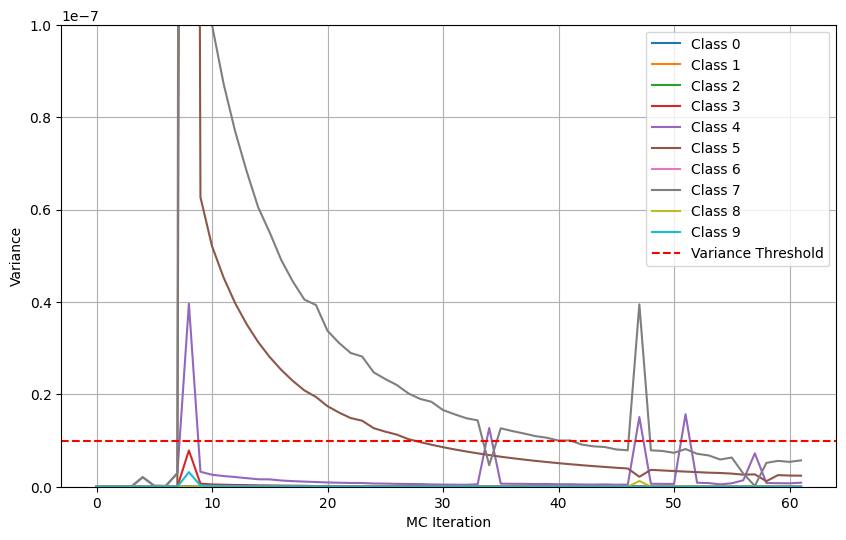

In [ ]:
# Parameters for adaptive MC dropout
num_mc_samples = 200  # Maximum number of MC dropout samples per image
patience = 10  # Number of iterations to check for stable variance
min_delta = 1e-8  # Variance stability threshold

index = 4
test_image = x_test[index:index+1]
true_label = np.argmax(y_test[index])

mc_preds = []
var_diffs_over_time = []

prev_variance = None
current_patience_count = 0

for j in range(num_mc_samples):
    preds = model(test_image, training=True)
    mc_preds.append(preds)

    if len(mc_preds) > 1:
        mc_preds_array = np.array(mc_preds).squeeze()
        current_variance = np.var(mc_preds_array, axis=0)

        if prev_variance is not None:
            var_diff = np.abs(current_variance - prev_variance)
            var_diffs_over_time.append(var_diff)

            if np.all(var_diff <= min_delta):
                current_patience_count += 1
            else:
                current_patience_count = 0

            if current_patience_count >= patience:
                break

        prev_variance = current_variance

var_diffs_over_time = np.array(var_diffs_over_time)

plt.figure(figsize=(10, 6))
for class_idx in range(var_diffs_over_time.shape[1]):
    plt.plot(var_diffs_over_time[:, class_idx], label=f'Class {class_idx}')

plt.axhline(y=min_delta, color='r', linestyle='--', label='Variance Threshold')
plt.xlabel('MC Iteration')
plt.ylabel('Variance')
plt.legend(loc='upper right')
plt.ylim([0, 1e-7])
plt.grid(True)
plt.show()

In [ ]:
true_label

7

### Mondrian CP

#### $\alpha$ = 0.05

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores_per_class = defaultdict(list)
alpha = 0.05

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs

        # Append scores to respective class lists
        for i, label in enumerate(batch_labels.numpy()):
            calibration_scores_per_class[int(label)].append(nonconformity_scores[i])

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

# Convert lists of scores to arrays for each class
for label in calibration_scores_per_class:
    calibration_scores_per_class[label] = np.array(calibration_scores_per_class[label])

Calibrating model: 79batch [02:40,  2.03s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.05

# Calculate q_hat for each class based on its calibration scores
q_hat_per_class = {
    label: np.quantile(scores, 1 - alpha, method="higher")
    for label, scores in calibration_scores_per_class.items()
}

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        batch_preds = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i].numpy()
            preds = batch_preds[i]

            # Compute nonconformity scores for all classes
            nonconformity_scores = 1 - preds  # Higher confidence corresponds to lower scores

            # Create prediction set based on class-specific q_hat thresholds
            prediction_set_indices = []
            for c in range(len(preds)):
                class_q_hat = q_hat_per_class.get(c, 1 - alpha)  # Get class-specific q_hat
                if nonconformity_scores[c] <= class_q_hat:
                    prediction_set_indices.append(c)

            # Sort the prediction set by descending probability
            sorted_prediction_indices = np.argsort(-preds[prediction_set_indices])  # Sort indices based on probabilities
            sorted_prediction_set = [prediction_set_indices[idx] for idx in sorted_prediction_indices]

            total_set_size += len(sorted_prediction_set)

            # Top-1, 5, & 10 accuracy: Is the true label in the top-1, 5, & 10 classes of the sorted prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check: Is the true label in the prediction set?
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"Final Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"Final Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"Final Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"Final Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [12:01,  2.31s/batch, Batch No.=313, Top-1 Accuracy=65.22%, Top-5 Accuracy=82.35%, Top-10 Accuracy=84.62%, Coverage=85.93%, Avg Set Size=12.18, Total Images Processed=4e+4]


Final Top-1 Accuracy: 65.22%
Final Top-5 Accuracy: 82.35%
Final Top-10 Accuracy: 84.62%
Final Coverage: 85.93%
Final Average Set Size: 12.18


In [ ]:
print(q_hat_per_class)

{726: 0.9956966, 917: 0.9997303, 13: 0.9547909, 939: 0.99704367, 6: 0.9997774, 983: 0.85961086, 655: 0.99619, 579: 0.927914, 702: 0.9984865, 845: 0.9679263, 69: 0.37727976, 822: 0.971528, 575: 0.9994991, 906: 0.9942239, 752: 0.9877593, 219: 0.924668, 192: 0.999453, 191: 0.98943776, 292: 0.49874312, 848: 0.9533604, 108: 0.9254868, 372: 0.57004726, 765: 0.95383334, 473: 0.9488338, 525: 0.99252176, 639: 0.977202, 686: 0.88290024, 99: 0.99210244, 127: 0.69717324, 76: 0.97465825, 905: 0.99304724, 550: 0.99481237, 30: 0.9145623, 634: 0.9316868, 907: 0.99216527, 979: 0.8766192, 718: 0.936872, 154: 0.99218553, 914: 0.99679875, 293: 0.7752217, 9: 0.0015694499, 922: 0.94605154, 130: 0.97268885, 33: 0.6124853, 968: 0.9968775, 719: 0.99992526, 653: 0.9842063, 840: 0.9882102, 139: 0.7187674, 198: 0.90280324, 236: 0.99970317, 304: 0.99915254, 547: 0.9961531, 940: 0.99551266, 215: 0.9742332, 853: 0.96131945, 805: 0.96339107, 28: 0.9202028, 104: 0.8953102, 67: 0.93325335, 311: 0.93638307, 429: 0.65943

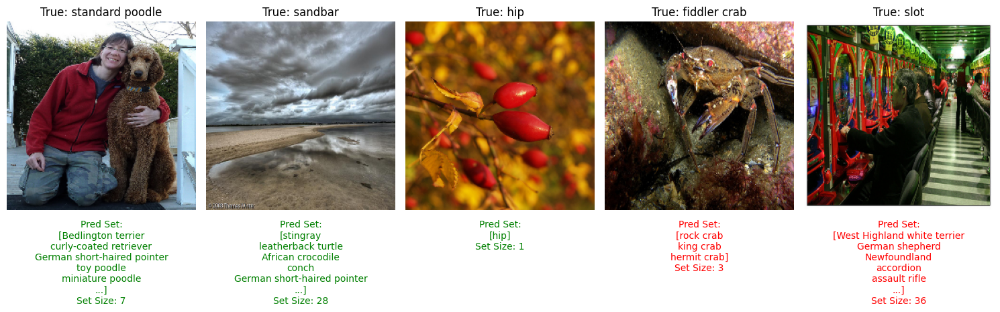

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get label name

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Compute nonconformity scores for all classes
    nonconformity_scores = 1 - pred  # Lower scores indicate higher confidence

    # Determine the prediction set based on class-specific q_hat thresholds
    prediction_set_indices = []
    for c in range(len(pred)):
        class_q_hat = q_hat_per_class.get(c, 1 - alpha)  # Get class-specific q_hat
        if nonconformity_scores[c] <= class_q_hat:
            prediction_set_indices.append(c)

    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]
    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

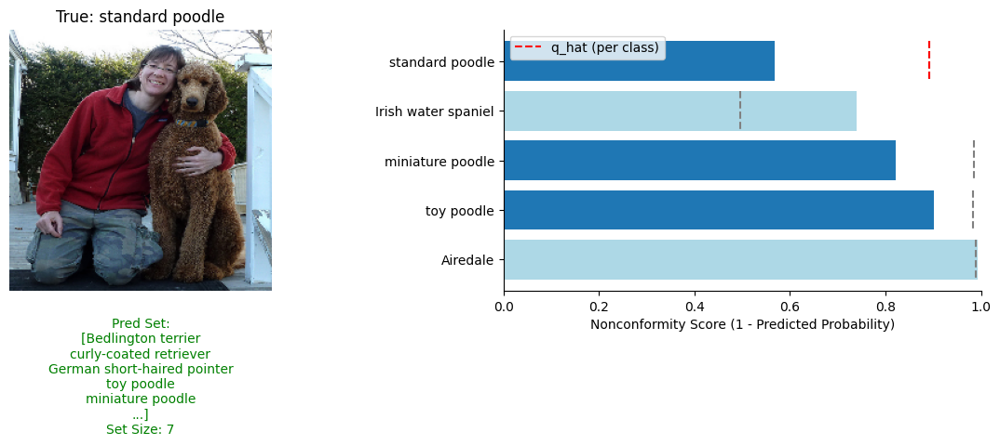

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Compute nonconformity scores for all classes
    nonconformity_scores = 1 - pred  # Lower scores are better

    # Determine prediction set based on class-specific q_hat thresholds
    prediction_set_indices = []
    for c in range(len(pred)):
        class_q_hat = q_hat_per_class.get(c, 1 - alpha)
        if nonconformity_scores[c] <= class_q_hat:
            prediction_set_indices.append(c)

    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]
    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Get top K classes based on nonconformity scores (lower is better)
    top_k = 5
    sorted_indices = np.argsort(nonconformity_scores)
    top_indices = sorted_indices[:top_k]
    top_nonconformity_scores = nonconformity_scores[top_indices]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = tf.image.resize(img, (224, 224)).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.1), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Plot nonconformity scores on the right
    bar_colors = ['tab:blue' if idx in prediction_set_indices else 'lightblue' for idx in top_indices]
    bars = ax[1].barh(top_labels, top_nonconformity_scores, color=bar_colors)
    ax[1].invert_yaxis()  # Highest-ranked class at the top
    ax[1].set_xlabel('Nonconformity Score (1 - Predicted Probability)')
    ax[1].set_xlim([0, 1])  # Nonconformity scores range from 0 to 1

    # Plot q_hat thresholds for top classes
    for bar, top_index, top_label in zip(bars, top_indices, top_labels):
        class_q_hat = q_hat_per_class.get(int(top_index), 1 - alpha)
        # Plot the q_hat threshold line over the bar
        ax[1].plot([class_q_hat, class_q_hat], [bar.get_y(), bar.get_y() + bar.get_height()],
                   color='gray', linestyle='--')

    # Highlight the true class threshold in red
    true_class_q_hat = q_hat_per_class.get(int(true_label), 1 - alpha)
    # Find the position of the true label in the top_indices (if present)
    if true_label in top_indices:
        idx = list(top_indices).index(true_label)
        bar = bars[idx]
        ax[1].plot([true_class_q_hat, true_class_q_hat], [bar.get_y(), bar.get_y() + bar.get_height()],
                   color='red', linestyle='--', label=f'q_hat (per class)')
    else:
        # If true label not in top_indices, plot at the bottom
        ax[1].plot([true_class_q_hat, true_class_q_hat], [bars[-1].get_y(), bars[-1].get_y() + bars[-1].get_height()],
                   color='red', linestyle='--', label=f'q_hat (per class)')

    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

#### $\alpha$ = 0.1

In [ ]:
model = tf.keras.applications.VGG19(weights='imagenet')
print("Approximate batches in test: {:.2f}".format(test_samples/batch_size))
print("Approximate batches in cal: {:.2f}".format(calibration_samples/batch_size))

Approximate batches in test: 312.50
Approximate batches in cal: 78.12


In [ ]:
# Step 1: Calibration Phase
total_calibrated = 0
batch_num = 0
calibration_scores_per_class = defaultdict(list)
alpha = 0.1

with tqdm(desc="Calibrating model", unit="batch") as pbar:
    for batch_images, batch_labels in calibration_dataset:
        batch_num += 1

        preds = model.predict_on_batch(batch_images)

        # Extract the predicted probabilities for the true labels
        true_label_probs = preds[np.arange(len(batch_labels)), batch_labels.numpy().astype(int)]

        # Compute nonconformity scores (1 - probability assigned to the true label)
        nonconformity_scores = 1 - true_label_probs

        # Append scores to respective class lists
        for i, label in enumerate(batch_labels.numpy()):
            calibration_scores_per_class[int(label)].append(nonconformity_scores[i])

        total_calibrated += len(batch_labels)

        pbar.set_postfix({
            "Batch No.": batch_num,
            "Total Images Processed": total_calibrated
        })
        pbar.update(1)

# Convert lists of scores to arrays for each class
for label in calibration_scores_per_class:
    calibration_scores_per_class[label] = np.array(calibration_scores_per_class[label])

Calibrating model: 79batch [02:49,  2.14s/batch, Batch No.=79, Total Images Processed=1e+4]


In [ ]:
total_predicted = 0
top1_correct = 0
top5_correct = 0
top10_correct = 0
total_set_size = 0
coverage_correct = 0

batch_num = 0
alpha = 0.1

# Calculate q_hat for each class based on its calibration scores
q_hat_per_class = {
    label: np.quantile(scores, 1 - alpha, method="higher")
    for label, scores in calibration_scores_per_class.items()
}

with tqdm(desc="Processing images", unit="batch") as pbar:
    for batch_images, batch_labels in test_dataset:
        batch_num += 1

        # Get model predictions (done once per batch)
        batch_preds = model.predict_on_batch(batch_images)

        # Calculate prediction sets and metrics in one loop
        for i in range(len(batch_images)):
            true_label = batch_labels[i].numpy()
            preds = batch_preds[i]

            # Compute nonconformity scores for all classes
            nonconformity_scores = 1 - preds  # Higher confidence corresponds to lower scores

            # Create prediction set based on class-specific q_hat thresholds
            prediction_set_indices = []
            for c in range(len(preds)):
                class_q_hat = q_hat_per_class.get(c, 1 - alpha)  # Get class-specific q_hat
                if nonconformity_scores[c] <= class_q_hat:
                    prediction_set_indices.append(c)

            # Sort the prediction set by descending probability
            sorted_prediction_indices = np.argsort(-preds[prediction_set_indices])  # Sort indices based on probabilities
            sorted_prediction_set = [prediction_set_indices[idx] for idx in sorted_prediction_indices]

            total_set_size += len(sorted_prediction_set)

            # Top-1, 5, & 10 accuracy: Is the true label in the top-1, 5, & 10 classes of the sorted prediction set?
            if true_label in sorted_prediction_set[:1]:
                top1_correct += 1
            if true_label in sorted_prediction_set[:5]:
                top5_correct += 1
            if true_label in sorted_prediction_set[:10]:
                top10_correct += 1

            # Coverage check: Is the true label in the prediction set?
            if true_label in sorted_prediction_set:
                coverage_correct += 1

        total_predicted += len(batch_labels)

        # Calculate current metrics
        current_top1_acc = 100.0 * top1_correct / total_predicted
        current_top5_acc = 100.0 * top5_correct / total_predicted
        current_top10_acc = 100.0 * top10_correct / total_predicted
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_set_size = total_set_size / total_predicted

        # Update progress bar once per batch
        pbar.set_postfix({
            "Batch No.": batch_num,
            "Top-1 Accuracy": f"{current_top1_acc:.2f}%",
            "Top-5 Accuracy": f"{current_top5_acc:.2f}%",
            "Top-10 Accuracy": f"{current_top10_acc:.2f}%",
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Set Size": f"{average_set_size:.2f}",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)

# Print final accuracies
print(f"\nFinal Top-1 Accuracy: {100.0 * top1_correct / total_predicted:.2f}%")
print(f"Final Top-5 Accuracy: {100.0 * top5_correct / total_predicted:.2f}%")
print(f"Final Top-10 Accuracy: {100.0 * top10_correct / total_predicted:.2f}%")
print(f"Final Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"Final Average Set Size: {average_set_size:.2f}")

Processing images: 313batch [12:33,  2.41s/batch, Batch No.=313, Top-1 Accuracy=64.69%, Top-5 Accuracy=80.00%, Top-10 Accuracy=81.52%, Coverage=82.06%, Avg Set Size=7.44, Total Images Processed=4e+4]


Final Top-1 Accuracy: 64.69%
Final Top-5 Accuracy: 80.00%
Final Top-10 Accuracy: 81.52%
Final Coverage: 82.06%
Final Average Set Size: 7.44


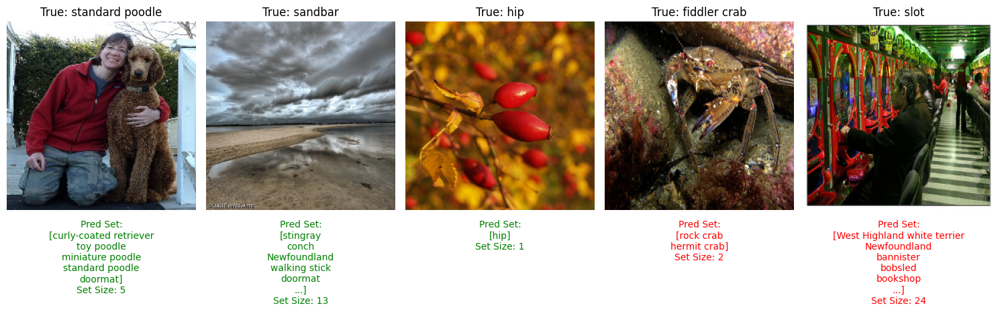

In [ ]:
n_samples = 5
start_index = 25
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index start_index to stop_index
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, image_shape[:2])
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label)).split(',')[0]  # Get label name

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Compute nonconformity scores for all classes
    nonconformity_scores = 1 - pred  # Lower scores indicate higher confidence

    # Determine the prediction set based on class-specific q_hat thresholds
    prediction_set_indices = []
    for c in range(len(pred)):
        class_q_hat = q_hat_per_class.get(c, 1 - alpha)  # Get class-specific q_hat
        if nonconformity_scores[c] <= class_q_hat:
            prediction_set_indices.append(c)

    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]
    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]

    # Add ellipsis if more than 5 labels in the set
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    img_cropped = (tf.image.resize(img, (224, 224))).numpy().astype("uint8")
    axes[i].imshow(img_cropped)
    axes[i].set_title(f"True: {true_label_name}", fontsize=12, color='black')
    pred_text = "\n".join(display_set)
    axes[i].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                     xy=(0.5, -0.05), xycoords='axes fraction',
                     ha='center', va='top',
                     fontsize=10, color=color)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

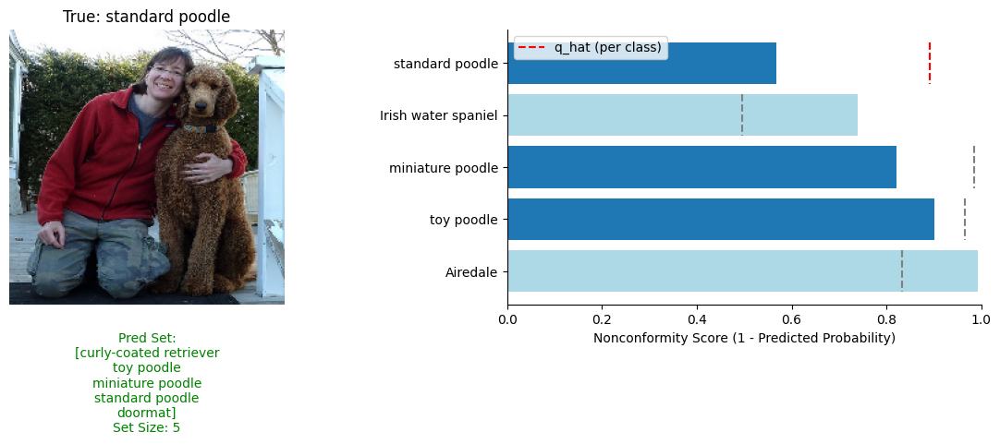

In [ ]:
n_samples = 1
start_index = 25
stop_index = start_index + n_samples

# Plot image and softmax probabilities in 1x2 subplot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Iterate through the example
for i, example in enumerate(islice(dataset_test, start_index, stop_index)):
    img = example['image']

    # Preprocess the image for the model
    img_preprocessed = tf.image.resize(img, (224, 224))
    img_preprocessed = tf.expand_dims(preprocess_input(img_preprocessed), axis=0)  # Add batch dimension

    # Get the true label and predicted probabilities
    true_label = example['label']
    true_label_name = label_map(int(true_label))

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)[0]

    # Compute nonconformity scores for all classes
    nonconformity_scores = 1 - pred  # Lower scores are better

    # Determine prediction set based on class-specific q_hat thresholds
    prediction_set_indices = []
    for c in range(len(pred)):
        class_q_hat = q_hat_per_class.get(c, 1 - alpha)
        if nonconformity_scores[c] <= class_q_hat:
            prediction_set_indices.append(c)

    prediction_set_names = [label_map(int(label)).split(',')[0] for label in prediction_set_indices]
    prediction_set_size = len(prediction_set_names)

    # Limit display to the first 5 labels
    display_set = prediction_set_names[:5]
    if len(prediction_set_names) > 5:
        display_set.append("...")

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set_indices else 'red'

    # Get top K classes based on nonconformity scores (lower is better)
    top_k = 5
    sorted_indices = np.argsort(nonconformity_scores)
    top_indices = sorted_indices[:top_k]
    top_nonconformity_scores = nonconformity_scores[top_indices]
    top_labels = [label_map(int(label)).split(',')[0] for label in top_indices]

    # Show image on the left
    img_cropped = tf.image.resize(img, (224, 224)).numpy().astype("uint8")
    ax[0].imshow(img_cropped)
    ax[0].set_title(f"True: {true_label_name}")
    pred_text = "\n".join(display_set)
    ax[0].annotate(f"Pred Set:\n[{pred_text}]\nSet Size: {prediction_set_size}",
                   xy=(0.5, -0.1), xycoords='axes fraction',
                   ha='center', va='top',
                   fontsize=10, color=color)
    ax[0].axis('off')

    # Plot nonconformity scores on the right
    bar_colors = ['tab:blue' if idx in prediction_set_indices else 'lightblue' for idx in top_indices]
    bars = ax[1].barh(top_labels, top_nonconformity_scores, color=bar_colors)
    ax[1].invert_yaxis()  # Highest-ranked class at the top
    ax[1].set_xlabel('Nonconformity Score (1 - Predicted Probability)')
    ax[1].set_xlim([0, 1])  # Nonconformity scores range from 0 to 1

    # Plot q_hat thresholds for top classes
    for bar, top_index, top_label in zip(bars, top_indices, top_labels):
        class_q_hat = q_hat_per_class.get(int(top_index), 1 - alpha)
        # Plot the q_hat threshold line over the bar
        ax[1].plot([class_q_hat, class_q_hat], [bar.get_y(), bar.get_y() + bar.get_height()],
                   color='gray', linestyle='--')

    # Highlight the true class threshold in red
    true_class_q_hat = q_hat_per_class.get(int(true_label), 1 - alpha)
    # Find the position of the true label in the top_indices (if present)
    if true_label in top_indices:
        idx = list(top_indices).index(true_label)
        bar = bars[idx]
        ax[1].plot([true_class_q_hat, true_class_q_hat], [bar.get_y(), bar.get_y() + bar.get_height()],
                   color='red', linestyle='--', label=f'q_hat (per class)')
    else:
        # If true label not in top_indices, plot at the bottom
        ax[1].plot([true_class_q_hat, true_class_q_hat], [bars[-1].get_y(), bars[-1].get_y() + bars[-1].get_height()],
                   color='red', linestyle='--', label=f'q_hat (per class)')

    ax[1].legend()
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Full Conformal Regression

## Load the dataset

In [ ]:
data = load_diabetes()
x = data.data
y = data.target

## Preprocess the dataset

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# Print the shapes to confirm
print(f"X_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (353, 10)
y_train shape: (353,)
X_test shape: (89, 10)
y_test shape: (89,)


## Train a base model

In [ ]:
def get_model(input_shape):
    input_layer = Input(shape=(input_shape,))

    hidden = Dense(64, activation='relu')(input_layer)
    hidden = Dense(64, activation='relu')(hidden)
    hidden = Dense(32, activation='relu')(hidden)

    output_layer = Dense(1, activation='linear')(hidden)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

In [ ]:
model = get_model(input_shape=x_train.shape[1])

batch_size = 32
epochs = 100

model.compile(optimizer='adam', loss='mae')
history = model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
print("Approximate batches in test: {:.2f}".format(x_test.shape[0] / batch_size))

Approximate batches in test: 2.78


## Test the accuracy of the base model

In [ ]:
batch_size = 32
num_batches = int(np.ceil(len(x_test) / batch_size))

total_samples = 0
total_absolute_error = 0
batch_num = 0

with tqdm(total=num_batches, desc="Processing batches", unit="batch") as pbar:
    for i in range(0, len(x_test), batch_size):
        batch_data = x_test[i:i + batch_size]
        batch_labels = y_test[i:i + batch_size]

        preds = model.predict_on_batch(batch_data)

        # Calculate MAE
        batch_mae = mean_absolute_error(batch_labels, preds)

        total_samples += len(batch_labels)
        total_absolute_error += batch_mae * len(batch_labels)
        mean_absolute_error_so_far = total_absolute_error / total_samples

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "MAE": f"{mean_absolute_error_so_far:.4f}",
            "Total Samples Processed": total_samples
        })
        pbar.update(1)
        batch_num += 1

print(f"Final MAE: {mean_absolute_error_so_far:.4f}")

Processing batches: 100%|██████████| 3/3 [00:01<00:00,  2.58batch/s, Batch No.=3, MAE=43.3573, Total Samples Processed=89]

Final MAE: 43.3573


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


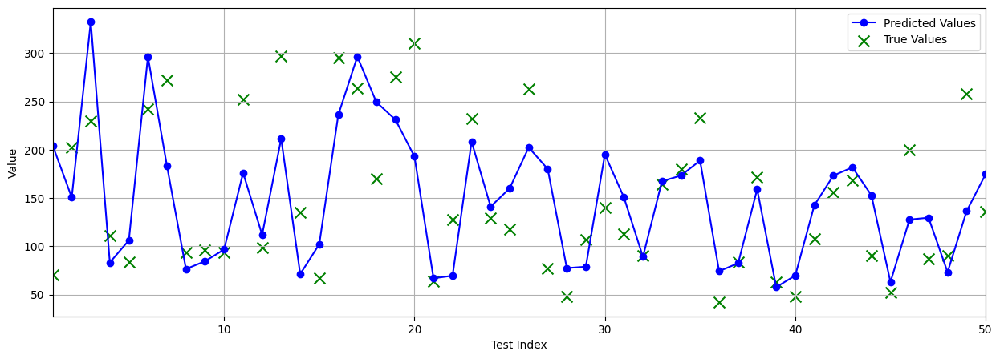

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]

y_pred = model.predict(x_subset)
sample_indices = np.arange(start_index, stop_index)

plt.figure(figsize=(15, 5))
plt.plot(sample_indices, y_pred, color='blue', marker='o', linestyle='-', label='Predicted Values')
plt.scatter(sample_indices, y_subset, color='green', marker='x', s=100, label='True Values')

plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.xlim([start_index, stop_index - 1])
plt.show()

## Train a quantile model

In [ ]:
def get_quant_model(input_shape, quantiles=[0.1, 0.5, 0.9]):
    input_layer = Input(shape=(input_shape,))

    hidden = Dense(64, activation='relu')(input_layer)
    hidden = Dense(64, activation='relu')(hidden)
    hidden = Dense(32, activation='relu')(hidden)

    output_layer = Dense(len(quantiles), activation='linear')(hidden)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

def quantile_loss(quantiles):
    def loss(y_true, y_pred):
        y_true_expanded = tf.expand_dims(y_true, axis=-1)

        errors = y_true_expanded - y_pred
        losses = []

        for i, q in enumerate(quantiles):
            error = errors[:, i]
            loss_q = tf.maximum(q * error, (q - 1) * error)  # Asymmetric quantile loss
            losses.append(tf.reduce_mean(loss_q))  # Mean loss for each quantile

        return tf.reduce_sum(losses)  # Sum losses across quantiles
    return loss

In [ ]:
model = get_quant_model(input_shape=x_train.shape[1])

batch_size = 32
epochs = 100
quantiles = [0.1, 0.5, 0.9]  # For example, the 10th, 50th, and 90th percentiles

model.compile(optimizer='adam', loss=quantile_loss(quantiles))
history = model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
print("Approximate batches in test: {:.2f}".format(x_test.shape[0] / batch_size))

Approximate batches in test: 2.78


In [ ]:
y_pred_quantiles = model.predict(x_test)

y_pred_lower = y_pred_quantiles[:, 0]  # 10th percentile
y_pred_median = y_pred_quantiles[:, 1] # 50th percentile (median)
y_pred_upper = y_pred_quantiles[:, 2]  # 90th percentile

out_of_coverage_indices = np.where((y_test < y_pred_lower) | (y_test > y_pred_upper))[0]
print("Indices of out-of-coverage predictions:", out_of_coverage_indices)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step
Indices of out-of-coverage predictions: [ 1  7 11 14 20 22 26 27 36 46 49 58 61 62 64 69 73 75 78 80 81 84 86]


## Test the accuracy of the quantile model

In [ ]:
batch_size = 32
num_batches = int(np.ceil(len(x_test) / batch_size))

total_samples = 0
total_in_coverage = 0
total_interval_width = 0
batch_num = 0

with tqdm(total=num_batches, desc="Processing batches", unit="batch") as pbar:
    for i in range(0, len(x_test), batch_size):
        batch_data = x_test[i:i + batch_size]
        batch_labels = y_test[i:i + batch_size]

        pred_quantiles = model.predict_on_batch(batch_data)
        lower_quantile = pred_quantiles[:, 0]
        median_pred = pred_quantiles[:, 1]
        upper_quantile = pred_quantiles[:, 2]

        # Calculate interval width for each prediction
        interval_width = upper_quantile - lower_quantile
        batch_interval_width = np.mean(interval_width)

        # Check if each true label falls within the predicted interval [lower_quantile, upper_quantile]
        in_coverage = (batch_labels >= lower_quantile) & (batch_labels <= upper_quantile)
        num_in_coverage = np.sum(in_coverage)

        total_samples += len(batch_labels)
        total_in_coverage += num_in_coverage
        total_interval_width += batch_interval_width * len(batch_labels)
        coverage_percentage = 100.0 * total_in_coverage / total_samples
        mean_interval_width_so_far = total_interval_width / total_samples

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "Coverage": f"{coverage_percentage:.2f}%",
            "Interval Width": f"{mean_interval_width_so_far:.4f}",
            "Total Samples Processed": total_samples
        })
        pbar.update(1)
        batch_num += 1

print(f"\nFinal Coverage: {coverage_percentage:.2f}% out of {total_samples} samples")
print(f"Final Interval Width: {mean_interval_width_so_far:.4f}")

Processing batches: 100%|██████████| 3/3 [00:00<00:00,  4.37batch/s, Batch No.=3, Coverage=74.16%, Interval Width=126.3467, Total Samples Processed=89]


Final Coverage: 74.16% out of 89 samples
Final Interval Width: 126.3467


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


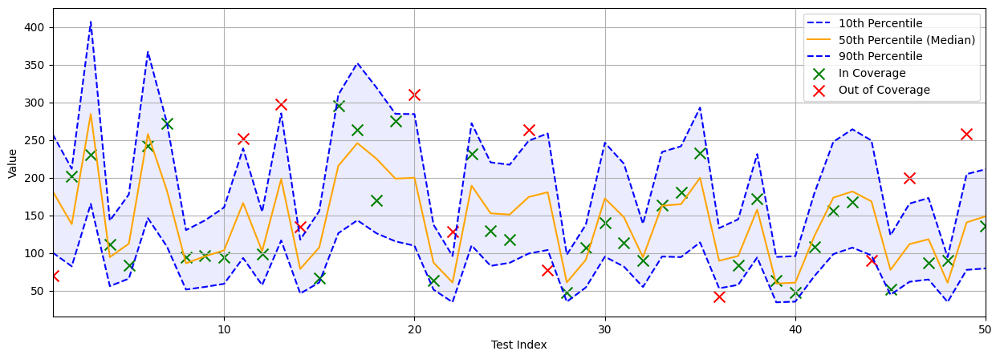

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]

y_pred_quantiles = model.predict(x_subset)
y_pred_lower = y_pred_quantiles[:, 0]  # 10th percentile
y_pred_median = y_pred_quantiles[:, 1]  # 50th percentile (median)
y_pred_upper = y_pred_quantiles[:, 2]  # 90th percentile
sample_indices = np.arange(start_index, stop_index)

plt.figure(figsize=(15, 5))

# Plot the shaded area between the 10th and 90th percentiles
plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)

# Plot individual quantile lines
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='10th Percentile')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='90th Percentile')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

# Plot true values as green or red crosses based on coverage
for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

## Algorithms

### Transductive CR

#### $\alpha = 0.05$, reg model

In [ ]:
alpha = 0.05
batch_size = 32
epochs = 100

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        # Select the test point
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Augment the training set with the test point and a pseudo target
        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        # Fit a new model on the augmented dataset
        model_aug = get_model(input_shape=x_train.shape[1])
        model_aug.compile(optimizer='adam', loss='mae')
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        # Compute nonconformity scores on the original training set
        def compute_nonconformity_score(model, x, y):
            y_pred = model.predict(x, verbose=0)
            nonconformity_scores = np.abs(y - y_pred.flatten())
            return nonconformity_scores

        # Get nonconformity scores for the calibration data (original training set)
        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        # Compute nonconformity score for the test point
        test_point_nonconformity = compute_nonconformity_score(model_aug, x_test_point, [true_value])[0]

        # Construct prediction interval
        prediction_lower = model_aug.predict(x_test_point, verbose=0)[0] - q_hat
        prediction_upper = model_aug.predict(x_test_point, verbose=0)[0] + q_hat
        prediction_interval = (prediction_lower, prediction_upper)
        interval_width = prediction_upper - prediction_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width.item()
        if prediction_lower <= true_value <= prediction_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

# Final metrics
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [09:44,  6.57s/point, Coverage=96.63%, Avg Interval Width=213.38, Total Points Processed=89]


Final Coverage: 96.63%

Final Average Interval Width: 213.38


Processing test points: 50point [05:24,  6.50s/point, Total Points Processed=50]


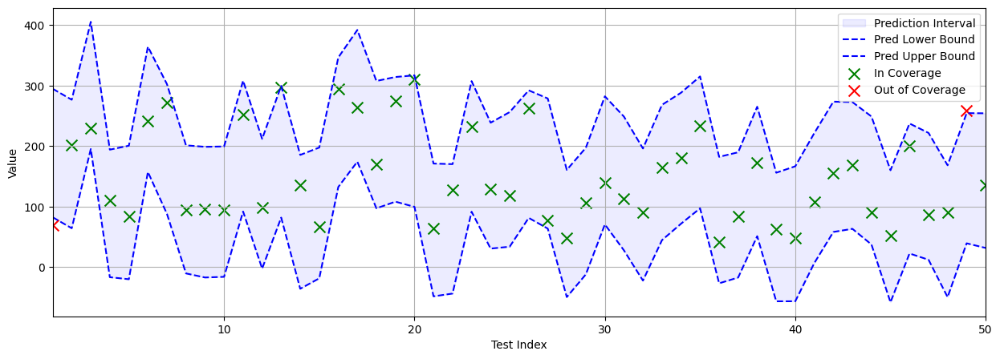

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

total_predicted = 0

# Initialize lists to store intervals and predictions
y_pred_lower = []
y_pred_upper = []
y_preds = []

# Process a subset of the test data for demonstration
x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

# Loop through each test point in the subset to compute intervals
with tqdm(desc="Processing test points", unit="point") as pbar:
  for test_idx in range(len(x_subset)):
      x_test_point = x_subset[test_idx].reshape(1, -1)
      true_value = y_subset[test_idx]

      # Augment the training set with the test point
      x_train_aug = np.vstack([x_train, x_test_point])
      y_train_aug = np.hstack([y_train, [true_value]])

      # Train a new model on the augmented dataset
      model_aug = get_model(input_shape=x_train.shape[1])
      model_aug.compile(optimizer='adam', loss='mae')
      model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

      # Compute nonconformity scores on the calibration set (original training set)
      def compute_nonconformity_score(model, x, y):
          y_pred = model.predict(x, verbose=0)
          nonconformity_scores = np.abs(y - y_pred.flatten())
          return nonconformity_scores

      # Calculate q_hat from nonconformity scores
      nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
      q_hat = np.quantile(nonconformity_scores, 1 - alpha)

      # Predict interval for the test point
      y_pred = model_aug.predict(x_test_point, verbose=0)[0]
      prediction_lower = y_pred - q_hat
      prediction_upper = y_pred + q_hat

      # Store the results
      y_preds.append(y_pred)
      y_pred_lower.append(prediction_lower)
      y_pred_upper.append(prediction_upper)

      total_predicted += 1
      pbar.set_postfix({
          "Total Points Processed": total_predicted
      })
      pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_preds = np.array(y_preds).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')
#plt.plot(sample_indices, y_preds, color='orange', marker='o', linestyle='-', label='Predicted Values')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\alpha = 0.1$, reg model

In [ ]:
alpha = 0.1
batch_size = 32
epochs = 100

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        # Select the test point
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Augment the training set with the test point and a pseudo target
        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        # Fit a new model on the augmented dataset
        model_aug = get_model(input_shape=x_train.shape[1])
        model_aug.compile(optimizer='adam', loss='mae')
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        # Compute nonconformity scores on the original training set
        def compute_nonconformity_score(model, x, y):
            y_pred = model.predict(x, verbose=0)
            nonconformity_scores = np.abs(y - y_pred.flatten())
            return nonconformity_scores

        # Get nonconformity scores for the calibration data (original training set)
        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        # Compute nonconformity score for the test point
        test_point_nonconformity = compute_nonconformity_score(model_aug, x_test_point, [true_value])[0]

        # Construct prediction interval
        prediction_lower = model_aug.predict(x_test_point, verbose=0)[0] - q_hat
        prediction_upper = model_aug.predict(x_test_point, verbose=0)[0] + q_hat
        prediction_interval = (prediction_lower, prediction_upper)
        interval_width = prediction_upper - prediction_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width.item()
        if prediction_lower <= true_value <= prediction_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

# Final metrics
print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [09:33,  6.44s/point, Coverage=92.13%, Avg Interval Width=173.91, Total Points Processed=89]


Final Coverage: 92.13%

Final Average Interval Width: 173.91


Processing test points: 50point [05:19,  6.39s/point, Total Points Processed=50]


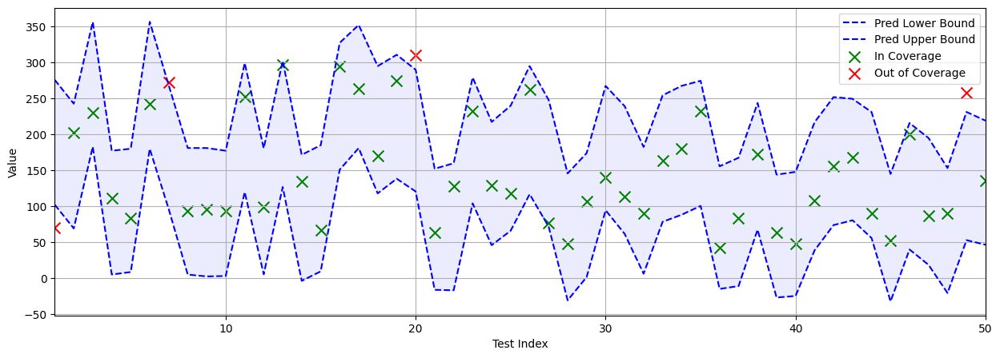

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

total_predicted = 0

# Initialize lists to store intervals and predictions
y_pred_lower = []
y_pred_upper = []
y_preds = []

# Process a subset of the test data for demonstration
x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

# Loop through each test point in the subset to compute intervals
with tqdm(desc="Processing test points", unit="point") as pbar:
  for test_idx in range(len(x_subset)):
      x_test_point = x_subset[test_idx].reshape(1, -1)
      true_value = y_subset[test_idx]

      # Augment the training set with the test point
      x_train_aug = np.vstack([x_train, x_test_point])
      y_train_aug = np.hstack([y_train, [true_value]])

      # Train a new model on the augmented dataset
      model_aug = get_model(input_shape=x_train.shape[1])
      model_aug.compile(optimizer='adam', loss='mae')
      model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

      # Compute nonconformity scores on the calibration set (original training set)
      def compute_nonconformity_score(model, x, y):
          y_pred = model.predict(x, verbose=0)
          nonconformity_scores = np.abs(y - y_pred.flatten())
          return nonconformity_scores

      # Calculate q_hat from nonconformity scores
      nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
      q_hat = np.quantile(nonconformity_scores, 1 - alpha)

      # Predict interval for the test point
      y_pred = model_aug.predict(x_test_point, verbose=0)[0]
      prediction_lower = y_pred - q_hat
      prediction_upper = y_pred + q_hat

      # Store the results
      y_preds.append(y_pred)
      y_pred_lower.append(prediction_lower)
      y_pred_upper.append(prediction_upper)

      total_predicted += 1
      pbar.set_postfix({
          "Total Points Processed": total_predicted
      })
      pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_preds = np.array(y_preds).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')
#plt.plot(sample_indices, y_preds, color='orange', marker='o', linestyle='-', label='Predicted Values')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\alpha = 0.05$, quant model

In [ ]:
alpha = 0.05
batch_size = 32
epochs = 100
quantiles = [0.1, 0.5, 0.9]  # 10th, 50th, and 90th percentiles

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Augment the training set with the test point and a pseudo target
        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        # Fit a new quantile model on the augmented dataset
        model_aug = get_quant_model(input_shape=x_train.shape[1], quantiles=quantiles)
        model_aug.compile(optimizer='adam', loss=quantile_loss(quantiles))
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        # Compute nonconformity scores for the calibration data
        def compute_nonconformity_score(model, x, y):
            y_pred_quantiles = model.predict(x, verbose=0)
            y_pred_lower = y_pred_quantiles[:, 0]
            y_pred_upper = y_pred_quantiles[:, 2]
            nonconformity_scores = np.maximum(0, np.maximum(y_pred_lower - y, y - y_pred_upper))
            return nonconformity_scores

        # Get nonconformity scores for the calibration set
        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        # Prediction interval for the test point
        y_pred_quantiles_test = model_aug.predict(x_test_point, verbose=0)
        prediction_lower = y_pred_quantiles_test[0, 0] - q_hat
        prediction_upper = y_pred_quantiles_test[0, 2] + q_hat
        interval_width = prediction_upper - prediction_lower

        total_predicted += 1
        total_interval_width += interval_width
        if prediction_lower <= true_value <= prediction_upper:
            coverage_correct += 1

        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [10:44,  7.24s/point, Coverage=97.75%, Avg Interval Width=196.22, Total Points Processed=89]


Final Coverage: 97.75%

Final Average Interval Width: 196.22


Processing test points: 50point [05:50,  7.02s/point]


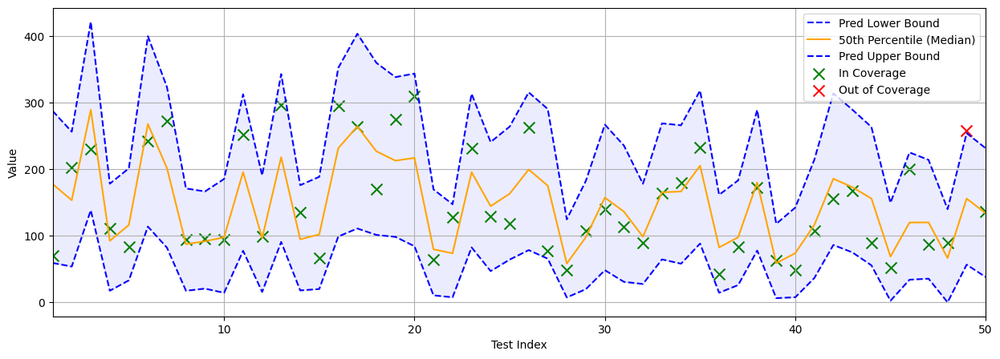

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        model_aug = get_quant_model(input_shape=x_train.shape[1], quantiles=quantiles)
        model_aug.compile(optimizer='adam', loss=quantile_loss(quantiles))
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred_quantiles_test = model_aug.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles_test[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles_test[0, 1]  # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles_test[0, 2]  # 90th percentile

        # Compute nonconformity scores for the calibration set
        def compute_nonconformity_score(model, x, y):
            y_pred_quantiles = model.predict(x, verbose=0)
            y_pred_lower = y_pred_quantiles[:, 0]
            y_pred_upper = y_pred_quantiles[:, 2]
            nonconformity_scores = np.maximum(0, np.maximum(y_pred_lower - y, y - y_pred_upper))
            return nonconformity_scores

        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        adjusted_lower = y_pred_lower_test - q_hat
        adjusted_upper = y_pred_upper_test + q_hat

        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

# True values as green or red crosses based on coverage
for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\alpha = 0.1$, quant model

In [ ]:
alpha = 0.1
batch_size = 32
epochs = 100
quantiles = [0.1, 0.5, 0.9]  # 10th, 50th, and 90th percentiles

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Augment the training set with the test point and a pseudo target
        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        # Fit a new quantile model on the augmented dataset
        model_aug = get_quant_model(input_shape=x_train.shape[1], quantiles=quantiles)
        model_aug.compile(optimizer='adam', loss=quantile_loss(quantiles))
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        # Compute nonconformity scores for the calibration data
        def compute_nonconformity_score(model, x, y):
            y_pred_quantiles = model.predict(x, verbose=0)
            y_pred_lower = y_pred_quantiles[:, 0]
            y_pred_upper = y_pred_quantiles[:, 2]
            nonconformity_scores = np.maximum(0, np.maximum(y_pred_lower - y, y - y_pred_upper))
            return nonconformity_scores

        # Get nonconformity scores for the calibration set
        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        # Prediction interval for the test point
        y_pred_quantiles_test = model_aug.predict(x_test_point, verbose=0)
        prediction_lower = y_pred_quantiles_test[0, 0] - q_hat
        prediction_upper = y_pred_quantiles_test[0, 2] + q_hat
        interval_width = prediction_upper - prediction_lower

        total_predicted += 1
        total_interval_width += interval_width
        if prediction_lower <= true_value <= prediction_upper:
            coverage_correct += 1

        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [10:20,  6.98s/point, Coverage=93.26%, Avg Interval Width=158.31, Total Points Processed=89]


Final Coverage: 93.26%

Final Average Interval Width: 158.31


Processing test points: 50point [05:48,  6.98s/point]


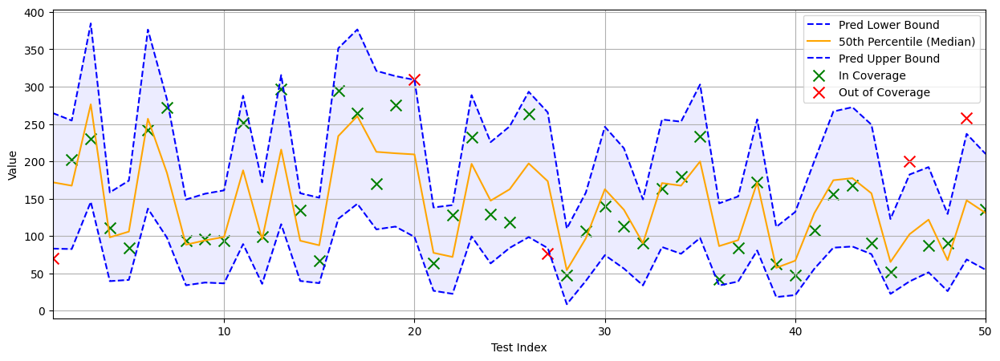

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        x_train_aug = np.vstack([x_train, x_test_point])
        y_train_aug = np.hstack([y_train, [true_value]])

        model_aug = get_quant_model(input_shape=x_train.shape[1], quantiles=quantiles)
        model_aug.compile(optimizer='adam', loss=quantile_loss(quantiles))
        model_aug.fit(x_train_aug, y_train_aug, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred_quantiles_test = model_aug.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles_test[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles_test[0, 1]  # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles_test[0, 2]  # 90th percentile

        # Compute nonconformity scores for the calibration set
        def compute_nonconformity_score(model, x, y):
            y_pred_quantiles = model.predict(x, verbose=0)
            y_pred_lower = y_pred_quantiles[:, 0]
            y_pred_upper = y_pred_quantiles[:, 2]
            nonconformity_scores = np.maximum(0, np.maximum(y_pred_lower - y, y - y_pred_upper))
            return nonconformity_scores

        nonconformity_scores = compute_nonconformity_score(model_aug, x_train, y_train)
        q_hat = np.quantile(nonconformity_scores, 1 - alpha)

        adjusted_lower = y_pred_lower_test - q_hat
        adjusted_upper = y_pred_upper_test + q_hat

        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

# True values as green or red crosses based on coverage
for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

# Split Conformal Regression

## Load the dataset

In [ ]:
data = load_diabetes()
x = data.data
y = data.target

## Preprocess the dataset

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train, x_cal, y_train, y_cal = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_cal = scaler.transform(x_cal)

# Print the shapes to confirm
print(f"X_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"X_cal shape: {x_cal.shape}")
print(f"y_cal shape: {y_cal.shape}")

X_train shape: (282, 10)
y_train shape: (282,)
X_test shape: (89, 10)
y_test shape: (89,)
X_cal shape: (71, 10)
y_cal shape: (71,)


## Train a quantile model

In [ ]:
def get_quant_model(input_shape, quantiles=[0.1, 0.5, 0.9]):
    input_layer = Input(shape=(input_shape,))

    hidden = Dense(64, activation='relu')(input_layer)
    hidden = Dense(64, activation='relu')(hidden)
    hidden = Dense(32, activation='relu')(hidden)

    output_layer = Dense(len(quantiles), activation='linear')(hidden)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

def quantile_loss(quantiles):
    def loss(y_true, y_pred):
        y_true_expanded = tf.expand_dims(y_true, axis=-1)

        errors = y_true_expanded - y_pred
        losses = []

        for i, q in enumerate(quantiles):
            error = errors[:, i]
            loss_q = tf.maximum(q * error, (q - 1) * error)  # Asymmetric quantile loss
            losses.append(tf.reduce_mean(loss_q))  # Mean loss for each quantile

        return tf.reduce_sum(losses)  # Sum losses across quantiles
    return loss

In [ ]:
model = get_quant_model(input_shape=x_train.shape[1])

batch_size = 32
epochs = 100
quantiles = [0.1, 0.5, 0.9]  # For example, the 10th, 50th, and 90th percentiles

model.compile(optimizer='adam', loss=quantile_loss(quantiles))
history = model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
print("Approximate batches in test: {:.2f}".format(x_test.shape[0] / batch_size))

Approximate batches in test: 2.78


In [ ]:
y_pred_quantiles = model.predict(x_test)

y_pred_lower = y_pred_quantiles[:, 0]  # 10th percentile
y_pred_median = y_pred_quantiles[:, 1] # 50th percentile (median)
y_pred_upper = y_pred_quantiles[:, 2]  # 90th percentile

out_of_coverage_indices = np.where((y_test < y_pred_lower) | (y_test > y_pred_upper))[0]
print("Indices of out-of-coverage predictions:", out_of_coverage_indices)

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 689ms/step
Indices of out-of-coverage predictions: [ 0  1  7 13 14 20 22 26 27 36 44 46 49 52 58 61 62 64 69 73 75 78 80 84
 86]


## Test the accuracy of the quantile model

In [ ]:
batch_size = 32
num_batches = int(np.ceil(len(x_test) / batch_size))

total_samples = 0
total_in_coverage = 0
total_interval_width = 0
batch_num = 0

with tqdm(total=num_batches, desc="Processing batches", unit="batch") as pbar:
    for i in range(0, len(x_test), batch_size):
        batch_data = x_test[i:i + batch_size]
        batch_labels = y_test[i:i + batch_size]

        pred_quantiles = model.predict_on_batch(batch_data)
        lower_quantile = pred_quantiles[:, 0]
        median_pred = pred_quantiles[:, 1]
        upper_quantile = pred_quantiles[:, 2]

        # Calculate interval width for each prediction
        interval_width = upper_quantile - lower_quantile
        batch_interval_width = np.mean(interval_width)

        # Check if each true label falls within the predicted interval [lower_quantile, upper_quantile]
        in_coverage = (batch_labels >= lower_quantile) & (batch_labels <= upper_quantile)
        num_in_coverage = np.sum(in_coverage)

        total_samples += len(batch_labels)
        total_in_coverage += num_in_coverage
        total_interval_width += batch_interval_width * len(batch_labels)
        coverage_percentage = 100.0 * total_in_coverage / total_samples
        mean_interval_width_so_far = total_interval_width / total_samples

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "Coverage": f"{coverage_percentage:.2f}%",
            "Interval Width": f"{mean_interval_width_so_far:.4f}",
            "Total Samples Processed": total_samples
        })
        pbar.update(1)
        batch_num += 1

print(f"\nFinal Coverage: {coverage_percentage:.2f}% out of {total_samples} samples")
print(f"Final Interval Width: {mean_interval_width_so_far:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


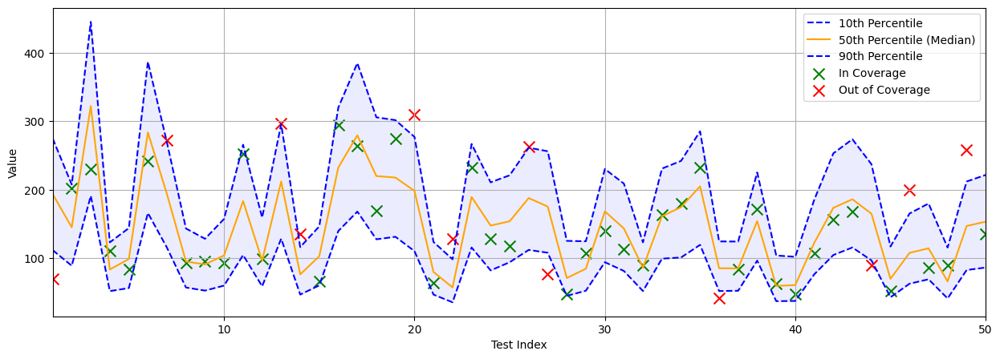

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]

y_pred_quantiles = model.predict(x_subset)
y_pred_lower = y_pred_quantiles[:, 0]  # 10th percentile
y_pred_median = y_pred_quantiles[:, 1]  # 50th percentile (median)
y_pred_upper = y_pred_quantiles[:, 2]  # 90th percentile
sample_indices = np.arange(start_index, stop_index)

plt.figure(figsize=(15, 5))

# Plot the shaded area between the 10th and 90th percentiles
plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)

# Plot individual quantile lines
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='10th Percentile')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='90th Percentile')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

# Plot true values as green or red crosses based on coverage
for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

## Algorithms

### Conformalized Quantile Regression (CQR)

#### $\alpha = 0.05$

In [ ]:
alpha = 0.05
calibration_scores = []

with tqdm(desc="Calibrating model", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)
        true_value = y_cal[i]

        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        nonconformity_score = max(0, max(y_pred_lower - true_value, true_value - y_pred_upper))
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

calibration_scores = np.array(calibration_scores)

Calibrating model: 71sample [00:04, 16.70sample/s]


In [ ]:
alpha = 0.05
q_hat = np.quantile(calibration_scores, 1 - alpha)
print(f"Calibration threshold (q_hat) for {1 - alpha:.2f} coverage: {q_hat:.4f}")

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0] - q_hat  # Adjusted 10th percentile
        y_pred_median = y_pred_quantiles[0, 1]         # 50th percentile (median)
        y_pred_upper = y_pred_quantiles[0, 2] + q_hat  # Adjusted 90th percentile

        # Calculate the prediction interval width
        interval_width = y_pred_upper - y_pred_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if y_pred_lower <= true_value <= y_pred_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Calibration threshold (q_hat) for 0.95 coverage: 42.6075


Processing test points: 89point [00:05, 17.57point/s, Coverage=94.38%, Avg Interval Width=203.77, Total Points Processed=89]


Final Coverage: 94.38%

Final Average Interval Width: 203.77


Processing test points: 50point [00:02, 17.63point/s]


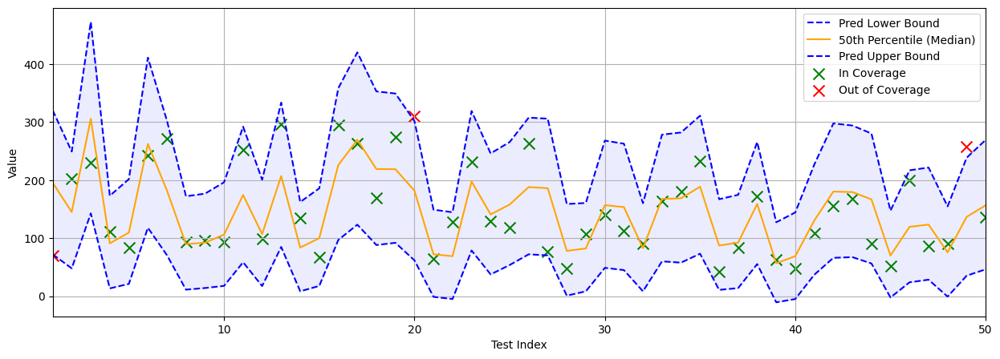

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0] - q_hat  # Adjusted 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1]         # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2] + q_hat  # Adjusted 90th percentile

        # Store predictions
        y_pred_lower.append(y_pred_lower_test)
        y_pred_upper.append(y_pred_upper_test)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\alpha = 0.1$

In [ ]:
alpha = 0.1
calibration_scores = []

with tqdm(desc="Calibrating model", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)
        true_value = y_cal[i]

        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        nonconformity_score = max(0, max(y_pred_lower - true_value, true_value - y_pred_upper))
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

calibration_scores = np.array(calibration_scores)

Calibrating model: 71sample [00:04, 16.48sample/s]


In [ ]:
alpha = 0.1
q_hat = np.quantile(calibration_scores, 1 - alpha)
print(f"Calibration threshold (q_hat) for {1 - alpha:.2f} coverage: {q_hat:.4f}")

total_predicted = 0
coverage_correct = 0
total_interval_width = 0

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0] - q_hat  # Adjusted 10th percentile
        y_pred_median = y_pred_quantiles[0, 1]         # 50th percentile (median)
        y_pred_upper = y_pred_quantiles[0, 2] + q_hat  # Adjusted 90th percentile

        # Calculate the prediction interval width
        interval_width = y_pred_upper - y_pred_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if y_pred_lower <= true_value <= y_pred_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Calibration threshold (q_hat) for 0.90 coverage: 23.1835


Processing test points: 89point [00:05, 16.72point/s, Coverage=88.76%, Avg Interval Width=164.92, Total Points Processed=89]


Final Coverage: 88.76%

Final Average Interval Width: 164.92


Processing test points: 50point [00:02, 17.63point/s]


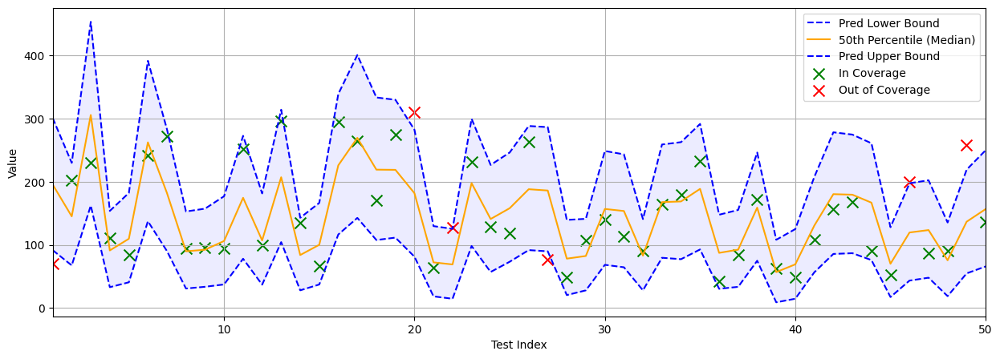

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0] - q_hat  # Adjusted 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1]         # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2] + q_hat  # Adjusted 90th percentile

        # Store predictions
        y_pred_lower.append(y_pred_lower_test)
        y_pred_upper.append(y_pred_upper_test)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

### Locally Adaptive CQR

#### $\alpha = 0.05$

In [ ]:
alpha = 0.05
calibration_scores = []

# Calibration loop for CQR
with tqdm(desc="Calibrating", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)

        # Predict quantiles using the quantile regression model
        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # CQR nonconformity score: width of the predicted interval
        nonconformity_score = y_pred_upper - y_pred_lower
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

# Convert to numpy array for further processing
calibration_scores = np.array(calibration_scores)

Calibrating: 71sample [00:04, 17.32sample/s]


In [ ]:
total_predicted = 0
coverage_correct = 0
total_interval_width = 0

def calculate_locally_adaptive_q_hat(test_point, x_cal, calibration_scores, alpha, gamma=1.0):
    test_point = test_point.reshape(1, -1)

    # Calculate Gaussian (RBF) kernel weights between the test point and all calibration points
    weights = rbf_kernel(test_point, x_cal, gamma=gamma).flatten()

    # Sort calibration scores and associated weights in ascending order
    sorted_indices = np.argsort(calibration_scores)
    sorted_scores = calibration_scores[sorted_indices]
    sorted_weights = weights[sorted_indices]

    # Compute cumulative weights and find where they cross the (1 - alpha) threshold
    cumulative_weights = np.cumsum(sorted_weights)
    threshold_weight = (1 - alpha) * cumulative_weights[-1]

    # Find the smallest score that exceeds the threshold weight
    q_hat_index = np.searchsorted(cumulative_weights, threshold_weight)
    q_hat = sorted_scores[q_hat_index]
    return q_hat

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles for the test point
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate locally adaptive q_hat using the calibration function
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower - q_hat_local
        adjusted_upper = y_pred_upper + q_hat_local
        interval_width = adjusted_upper - adjusted_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if adjusted_lower <= true_value <= adjusted_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [00:05, 16.09point/s, Coverage=100.00%, Avg Interval Width=396.95, Total Points Processed=89]


Final Coverage: 100.00%

Final Average Interval Width: 396.95


Processing test points: 50point [00:03, 15.84point/s]


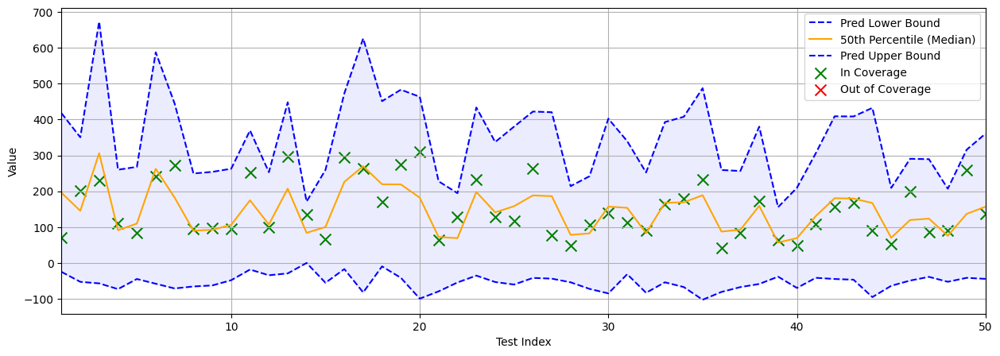

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1] # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate the locally adaptive q_hat for the test point
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha, gamma=1.0)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower_test - q_hat_local
        adjusted_upper = y_pred_upper_test + q_hat_local

        # Store predictions
        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\alpha = 0.1$

In [ ]:
alpha = 0.1
calibration_scores = []

# Calibration loop for CQR
with tqdm(desc="Calibrating", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)

        # Predict quantiles using the quantile regression model
        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # CQR nonconformity score: width of the predicted interval
        nonconformity_score = y_pred_upper - y_pred_lower
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

# Convert to numpy array for further processing
calibration_scores = np.array(calibration_scores)

Calibrating: 71sample [00:04, 16.89sample/s]


In [ ]:
total_predicted = 0
coverage_correct = 0
total_interval_width = 0

def calculate_locally_adaptive_q_hat(test_point, x_cal, calibration_scores, alpha, gamma=1.0):
    test_point = test_point.reshape(1, -1)

    # Calculate Gaussian (RBF) kernel weights between the test point and all calibration points
    weights = rbf_kernel(test_point, x_cal, gamma=gamma).flatten()

    # Sort calibration scores and associated weights in ascending order
    sorted_indices = np.argsort(calibration_scores)
    sorted_scores = calibration_scores[sorted_indices]
    sorted_weights = weights[sorted_indices]

    # Compute cumulative weights and find where they cross the (1 - alpha) threshold
    cumulative_weights = np.cumsum(sorted_weights)
    threshold_weight = (1 - alpha) * cumulative_weights[-1]

    # Find the smallest score that exceeds the threshold weight
    q_hat_index = np.searchsorted(cumulative_weights, threshold_weight)
    q_hat = sorted_scores[q_hat_index]
    return q_hat

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles for the test point
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate locally adaptive q_hat using the calibration function
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower - q_hat_local
        adjusted_upper = y_pred_upper + q_hat_local
        interval_width = adjusted_upper - adjusted_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if adjusted_lower <= true_value <= adjusted_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [00:05, 16.48point/s, Coverage=100.00%, Avg Interval Width=384.35, Total Points Processed=89]


Final Coverage: 100.00%

Final Average Interval Width: 384.35


Processing test points: 50point [00:02, 17.14point/s]


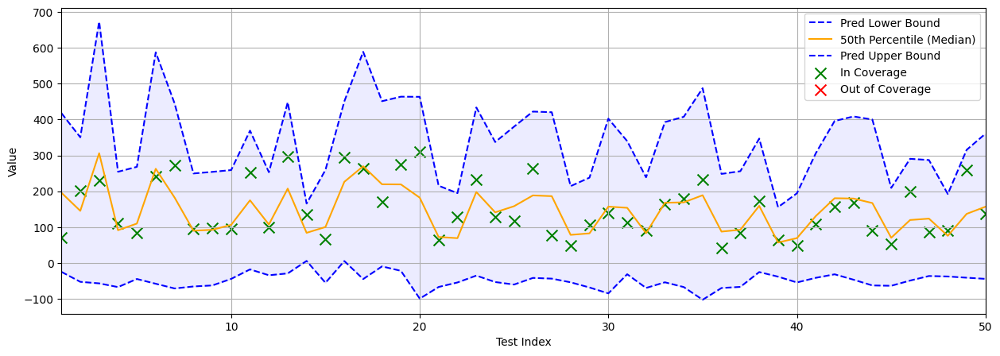

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1] # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate the locally adaptive q_hat for the test point
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha, gamma=1.0)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower_test - q_hat_local
        adjusted_upper = y_pred_upper_test + q_hat_local

        # Store predictions
        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\gamma = 0.5$

In [ ]:
alpha = 0.1
calibration_scores = []

# Calibration loop for CQR
with tqdm(desc="Calibrating", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)

        # Predict quantiles using the quantile regression model
        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # CQR nonconformity score: width of the predicted interval
        nonconformity_score = y_pred_upper - y_pred_lower
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

# Convert to numpy array for further processing
calibration_scores = np.array(calibration_scores)

Calibrating: 71sample [00:04, 17.18sample/s]


In [ ]:
total_predicted = 0
coverage_correct = 0
total_interval_width = 0

def calculate_locally_adaptive_q_hat(test_point, x_cal, calibration_scores, alpha, gamma=0.5):
    test_point = test_point.reshape(1, -1)

    # Calculate Gaussian (RBF) kernel weights between the test point and all calibration points
    weights = rbf_kernel(test_point, x_cal, gamma=gamma).flatten()

    # Sort calibration scores and associated weights in ascending order
    sorted_indices = np.argsort(calibration_scores)
    sorted_scores = calibration_scores[sorted_indices]
    sorted_weights = weights[sorted_indices]

    # Compute cumulative weights and find where they cross the (1 - alpha) threshold
    cumulative_weights = np.cumsum(sorted_weights)
    threshold_weight = (1 - alpha) * cumulative_weights[-1]

    # Find the smallest score that exceeds the threshold weight
    q_hat_index = np.searchsorted(cumulative_weights, threshold_weight)
    q_hat = sorted_scores[q_hat_index]
    return q_hat

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles for the test point
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate locally adaptive q_hat using the calibration function
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower - q_hat_local
        adjusted_upper = y_pred_upper + q_hat_local
        interval_width = adjusted_upper - adjusted_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if adjusted_lower <= true_value <= adjusted_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [00:05, 16.62point/s, Coverage=100.00%, Avg Interval Width=404.87, Total Points Processed=89]


Final Coverage: 100.00%

Final Average Interval Width: 404.87


Processing test points: 50point [00:02, 16.99point/s]


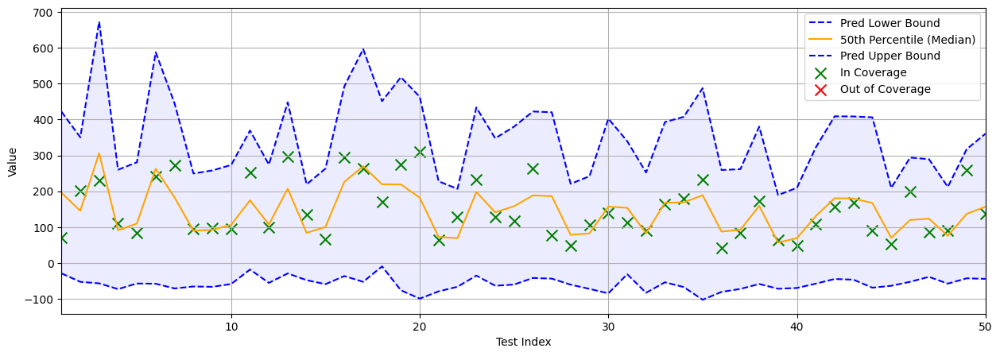

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1] # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate the locally adaptive q_hat for the test point
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha, gamma=0.5)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower_test - q_hat_local
        adjusted_upper = y_pred_upper_test + q_hat_local

        # Store predictions
        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\gamma = 5.0$

In [ ]:
alpha = 0.1
calibration_scores = []

# Calibration loop for CQR
with tqdm(desc="Calibrating", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)

        # Predict quantiles using the quantile regression model
        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # CQR nonconformity score: width of the predicted interval
        nonconformity_score = y_pred_upper - y_pred_lower
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

# Convert to numpy array for further processing
calibration_scores = np.array(calibration_scores)

Calibrating: 71sample [00:04, 16.61sample/s]


In [ ]:
total_predicted = 0
coverage_correct = 0
total_interval_width = 0

def calculate_locally_adaptive_q_hat(test_point, x_cal, calibration_scores, alpha, gamma=5.0):
    test_point = test_point.reshape(1, -1)

    # Calculate Gaussian (RBF) kernel weights between the test point and all calibration points
    weights = rbf_kernel(test_point, x_cal, gamma=gamma).flatten()

    # Sort calibration scores and associated weights in ascending order
    sorted_indices = np.argsort(calibration_scores)
    sorted_scores = calibration_scores[sorted_indices]
    sorted_weights = weights[sorted_indices]

    # Compute cumulative weights and find where they cross the (1 - alpha) threshold
    cumulative_weights = np.cumsum(sorted_weights)
    threshold_weight = (1 - alpha) * cumulative_weights[-1]

    # Find the smallest score that exceeds the threshold weight
    q_hat_index = np.searchsorted(cumulative_weights, threshold_weight)
    q_hat = sorted_scores[q_hat_index]
    return q_hat

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles for the test point
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate locally adaptive q_hat using the calibration function
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower - q_hat_local
        adjusted_upper = y_pred_upper + q_hat_local
        interval_width = adjusted_upper - adjusted_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if adjusted_lower <= true_value <= adjusted_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [00:05, 15.82point/s, Coverage=98.88%, Avg Interval Width=356.97, Total Points Processed=89]


Final Coverage: 98.88%

Final Average Interval Width: 356.97


Processing test points: 50point [00:02, 17.05point/s]


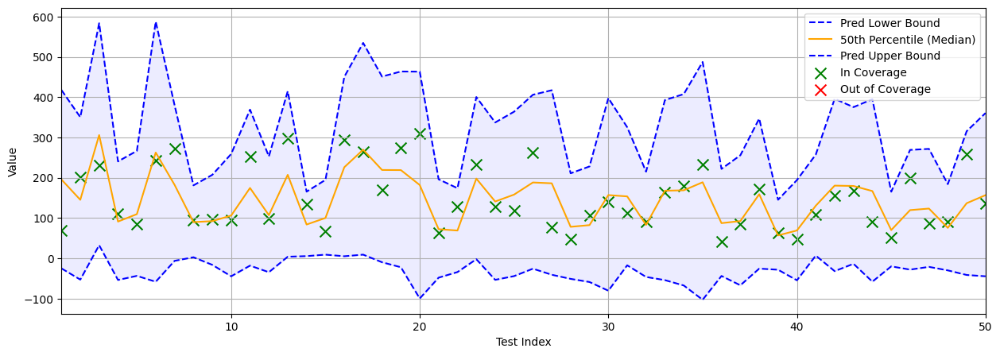

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1] # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate the locally adaptive q_hat for the test point
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha, gamma=5.0)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower_test - q_hat_local
        adjusted_upper = y_pred_upper_test + q_hat_local

        # Store predictions
        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

#### $\gamma = 10.0$

In [ ]:
alpha = 0.1
calibration_scores = []

# Calibration loop for CQR
with tqdm(desc="Calibrating", unit="sample") as pbar:
    for i in range(len(x_cal)):
        x_cal_point = x_cal[i].reshape(1, -1)

        # Predict quantiles using the quantile regression model
        y_pred_quantiles = model.predict(x_cal_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # CQR nonconformity score: width of the predicted interval
        nonconformity_score = y_pred_upper - y_pred_lower
        calibration_scores.append(nonconformity_score)

        pbar.update(1)

# Convert to numpy array for further processing
calibration_scores = np.array(calibration_scores)

Calibrating: 71sample [00:04, 17.30sample/s]


In [ ]:
total_predicted = 0
coverage_correct = 0
total_interval_width = 0

def calculate_locally_adaptive_q_hat(test_point, x_cal, calibration_scores, alpha, gamma=10.0):
    test_point = test_point.reshape(1, -1)

    # Calculate Gaussian (RBF) kernel weights between the test point and all calibration points
    weights = rbf_kernel(test_point, x_cal, gamma=gamma).flatten()

    # Sort calibration scores and associated weights in ascending order
    sorted_indices = np.argsort(calibration_scores)
    sorted_scores = calibration_scores[sorted_indices]
    sorted_weights = weights[sorted_indices]

    # Compute cumulative weights and find where they cross the (1 - alpha) threshold
    cumulative_weights = np.cumsum(sorted_weights)
    threshold_weight = (1 - alpha) * cumulative_weights[-1]

    # Find the smallest score that exceeds the threshold weight
    q_hat_index = np.searchsorted(cumulative_weights, threshold_weight)
    q_hat = sorted_scores[q_hat_index]
    return q_hat

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_test)):
        x_test_point = x_test[test_idx].reshape(1, -1)
        true_value = y_test[test_idx]

        # Predict quantiles for the test point
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_upper = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate locally adaptive q_hat using the calibration function
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower - q_hat_local
        adjusted_upper = y_pred_upper + q_hat_local
        interval_width = adjusted_upper - adjusted_lower

        # Update metrics
        total_predicted += 1
        total_interval_width += interval_width
        if adjusted_lower <= true_value <= adjusted_upper:
            coverage_correct += 1

        # Update progress bar and metrics
        current_coverage = 100.0 * coverage_correct / total_predicted
        average_interval_width = total_interval_width / total_predicted

        pbar.set_postfix({
            "Coverage": f"{current_coverage:.2f}%",
            "Avg Interval Width": f"{average_interval_width:.2f}",
            "Total Points Processed": total_predicted
        })
        pbar.update(1)

print(f"\nFinal Coverage: {100.0 * coverage_correct / total_predicted:.2f}%")
print(f"\nFinal Average Interval Width: {average_interval_width:.2f}")

Processing test points: 89point [00:05, 16.77point/s, Coverage=98.88%, Avg Interval Width=352.51, Total Points Processed=89]


Final Coverage: 98.88%

Final Average Interval Width: 352.51


Processing test points: 50point [00:02, 17.02point/s]


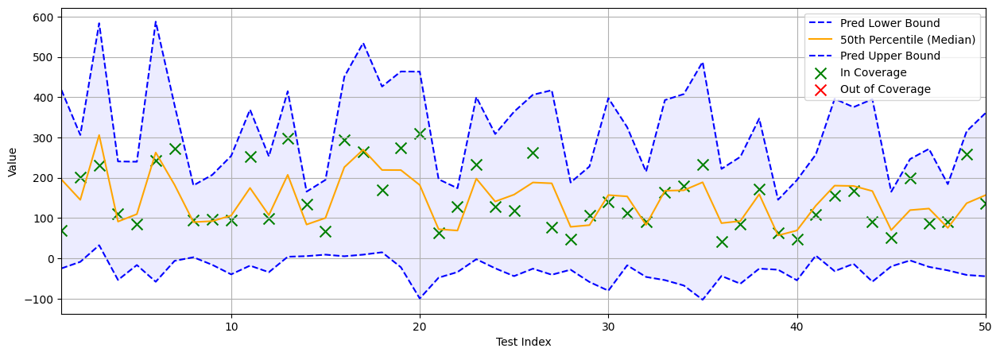

In [ ]:
n_samples = 50
start_index = 1
stop_index = start_index + n_samples

y_pred_lower = []
y_pred_upper = []
y_pred_median = []

x_subset = x_test[start_index:stop_index]
y_subset = y_test[start_index:stop_index]
sample_indices = np.arange(start_index, stop_index)

with tqdm(desc="Processing test points", unit="point") as pbar:
    for test_idx in range(len(x_subset)):
        x_test_point = x_subset[test_idx].reshape(1, -1)
        true_value = y_subset[test_idx]

        # Predict quantiles using the pre-trained quantile model
        y_pred_quantiles = model.predict(x_test_point, verbose=0)
        y_pred_lower_test = y_pred_quantiles[0, 0]  # 10th percentile
        y_pred_median_test = y_pred_quantiles[0, 1] # 50th percentile (median)
        y_pred_upper_test = y_pred_quantiles[0, 2]  # 90th percentile

        # Calculate the locally adaptive q_hat for the test point
        q_hat_local = calculate_locally_adaptive_q_hat(x_test_point, x_cal, calibration_scores, alpha, gamma=10.0)

        # Adjust the prediction interval with the locally adaptive q_hat
        adjusted_lower = y_pred_lower_test - q_hat_local
        adjusted_upper = y_pred_upper_test + q_hat_local

        # Store predictions
        y_pred_lower.append(adjusted_lower)
        y_pred_upper.append(adjusted_upper)
        y_pred_median.append(y_pred_median_test)

        pbar.update(1)

# Convert lists to numpy arrays for easier plotting
y_pred_lower = np.array(y_pred_lower).flatten()
y_pred_upper = np.array(y_pred_upper).flatten()
y_pred_median = np.array(y_pred_median).flatten()

# Plotting
plt.figure(figsize=(15, 5))

plt.fill_between(sample_indices, y_pred_lower, y_pred_upper, color='blue', alpha=0.075)
plt.plot(sample_indices, y_pred_lower, color='blue', linestyle='--', label='Pred Lower Bound')
plt.plot(sample_indices, y_pred_median, color='orange', linestyle='-', label='50th Percentile (Median)')
plt.plot(sample_indices, y_pred_upper, color='blue', linestyle='--', label='Pred Upper Bound')

# Add legend entries for "In Coverage" and "Out of Coverage"
plt.scatter([], [], color='green', marker='x', s=100, label='In Coverage')
plt.scatter([], [], color='red', marker='x', s=100, label='Out of Coverage')

for i, true_value in zip(sample_indices, y_subset):
    if y_pred_lower[i - start_index] <= true_value <= y_pred_upper[i - start_index]:
        plt.scatter(i, true_value, color='green', marker='x', s=100)
    else:
        plt.scatter(i, true_value, color='red', marker='x', s=100)

# Add labels, legend, and grid
plt.xlabel("Test Index")
plt.ylabel("Value")
plt.legend()
plt.xlim([start_index, stop_index - 1])
plt.grid(True)
plt.show()

# Sequential/Time Series Conformal Regression

## Load the dataset

In [ ]:
airline_data = load_airline()
y = load_airline()

In [ ]:
y

,Number of airline passengers
Period,
1949-01,112.0
1949-02,118.0
1949-03,132.0
1949-04,129.0
1949-05,121.0
...,...
1960-08,606.0
1960-09,508.0
1960-10,461.0


## Preprocess the dataset

In [ ]:
def create_supervised_data(data, lookback=12):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i + lookback])
        y.append(data[i + lookback])
    return np.array(X), np.array(y)

In [ ]:
data = y.values

train_size = int(len(data) * 0.8)  # 80% for training, 20% for testing
train_data = data[:train_size]
test_data = data[train_size:]

scaler = StandardScaler()
train_data_scaled = scaler.fit_transform(train_data.reshape(-1, 1))
test_data_scaled = scaler.transform(test_data.reshape(-1, 1))

lookback = 12
x_train, y_train = create_supervised_data(train_data_scaled, lookback)
x_test, y_test = create_supervised_data(test_data_scaled, lookback)

# Reshape for the Conv1D model
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], 1)
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], 1)

# Print the shapes to confirm
print(f"Train data shape: {x_train.shape}")
print(f"Test data shape: {x_test.shape}")
print(f"Train target shape: {y_train.shape}")
print(f"Test target shape: {y_test.shape}")

Train data shape: (103, 12, 1)
Test data shape: (17, 12, 1)
Train target shape: (103, 1)
Test target shape: (17, 1)


## Train a base model

In [ ]:
def get_model(input_shape, quantiles=[0.1, 0.5, 0.9]):
    input_layer = Input(input_shape)

    conv1 = Conv1D(16, kernel_size=3, activation='relu')(input_layer)
    pool1 = MaxPooling1D(pool_size=2)(conv1)
    conv2 = Conv1D(32, kernel_size=3, activation='relu')(pool1)

    flatten = Flatten()(conv2)
    dense1 = Dense(32, activation='relu')(flatten)
    output_layer = Dense(len(quantiles))(dense1)  # For three quantiles, for example 0.1, 0.5, 0.9

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

def quantile_loss(quantiles):
    def loss(y_true, y_pred):
        loss_val = 0
        for i, q in enumerate(quantiles):
            e = y_true - y_pred[:, i:i+1]
            loss_val += tf.reduce_mean(tf.maximum(q*e, (q-1)*e))
        return loss_val / len(quantiles)
    return loss

In [ ]:
input_shape = (12, 1)  # 12 timesteps, 1 feature (for time series input)
quantiles = [0.1, 0.5, 0.9]
model = get_model(input_shape, quantiles)

batch_size = 32
epochs = 50

model.compile(optimizer='adam', loss=quantile_loss(quantiles))
model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

## Test the accuracy of the base model

In [ ]:
predictions = model.predict(x_test)

lower_bound = predictions[:, 0]  # 10th percentile
median = predictions[:, 1]       # 50th percentile (median)
upper_bound = predictions[:, 2]  # 90th percentile

median_mae = np.mean(np.abs(median - y_test))
median_mse = np.mean((median - y_test) ** 2)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
lower_bounds_inverse = scaler.inverse_transform(lower_bound.reshape(-1, 1)).flatten()
upper_bounds_inverse = scaler.inverse_transform(upper_bound.reshape(-1, 1)).flatten()

num_test_points = len(y_test_inverse)
covered_points = np.sum((lower_bounds_inverse.flatten() <= y_test_inverse.flatten()) & (y_test_inverse.flatten() <= upper_bounds_inverse.flatten()))
coverage_percentage = 100 * covered_points / num_test_points
actual_values = y_test_inverse
avg_width = np.mean(upper_bounds_inverse - lower_bounds_inverse)

print(f"Median Prediction - Mean Absolute Error (MAE): {median_mae:.4f}")
print(f"Median Prediction - Mean Squared Error (MSE): {median_mse:.4f}")
print(f"Prediction Interval Coverage (10th-90th): {coverage_percentage:.2f}%")
print(f"Average Prediction Interval Width: {avg_width:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Median Prediction - Mean Absolute Error (MAE): 0.9796
Median Prediction - Mean Squared Error (MSE): 1.4914
Prediction Interval Coverage (10th-90th): 29.41%
Average Prediction Interval Width: 37.2128


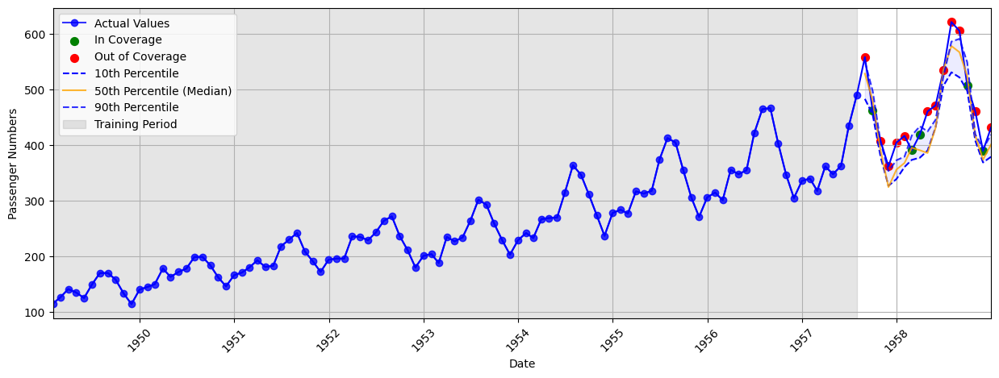

In [ ]:
# Inverse transform train, test, and prediction quantiles
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile (median)
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])
prediction_median_data = np.concatenate([np.full_like(y_train_inverse, np.nan), predictions_median])

# Generate date range for x-axis
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if predictions_lower[i] <= true_value <= predictions_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], predictions_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], predictions_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], predictions_lower.flatten(), predictions_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[0], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

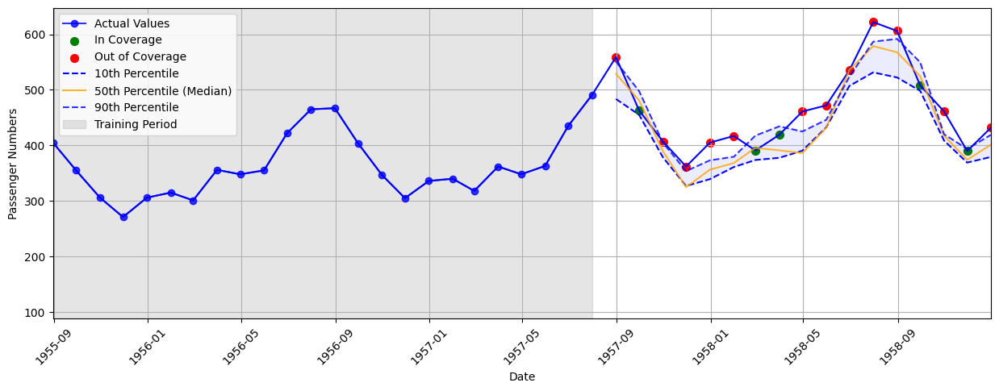

In [ ]:
# Inverse transform train and test data
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

# Extract quantile predictions and inverse transform
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])

# Generate date range for x-axis (if period index exists in your dataset)
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if predictions_lower[i] <= true_value <= predictions_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], predictions_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], predictions_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], predictions_lower.flatten(), predictions_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[len(y_train_inverse) - 24], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

## Algorithms

### Weighted Conformal Prediction for Distribution Drift

#### $\alpha = 0.05$

In [ ]:
def weighted_quantile(values, quantile, weights=None):
    if weights is None:
        weights = np.ones_like(values)
    sorter = np.argsort(values)
    values = values[sorter]
    weights = weights[sorter]
    cumulative_weights = np.cumsum(weights)
    cumulative_weights /= cumulative_weights[-1]
    return values[np.searchsorted(cumulative_weights, quantile)]

def calculate_weights(n, decay_factor=0.95):
    # Weights decrease exponentially as we go further back in time
    return np.array([decay_factor ** (n - i - 1) for i in range(n)])

In [ ]:
alpha = 0.05
calibration_size = 50  # Use the last 50 samples for calibration

calibration_data = y_train[-calibration_size:]
calibration_predictions = model.predict(x_train[-calibration_size:])

calibration_lower = calibration_predictions[:, 0]  # 10th percentile
calibration_median = calibration_predictions[:, 1]  # 50th percentile
calibration_upper = calibration_predictions[:, 2]  # 90th percentile

calibration_scores_lower = np.abs(calibration_lower - calibration_data.flatten())
calibration_scores_upper = np.abs(calibration_upper - calibration_data.flatten())

weights = calculate_weights(len(calibration_scores_lower))
normalized_weights = weights / np.sum(weights)

lower_bounds = []
upper_bounds = []

for i in range(len(x_test)):
    test_prediction = model.predict(x_test[i].reshape(1, -1, 1), verbose=0).flatten()

    test_lower = test_prediction[0]
    test_upper = test_prediction[2]

    qhat_lower = weighted_quantile(
        calibration_scores_lower,
        quantile=1 - alpha,
        weights=normalized_weights
    )
    qhat_upper = weighted_quantile(
        calibration_scores_upper,
        quantile=1 - alpha,
        weights=normalized_weights
    )

    lower_bound = test_lower - qhat_lower
    upper_bound = test_upper + qhat_upper

    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

lower_bounds = np.array(lower_bounds)
upper_bounds = np.array(upper_bounds)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
lower_bounds_inverse = scaler.inverse_transform(lower_bounds.reshape(-1, 1)).flatten()
upper_bounds_inverse = scaler.inverse_transform(upper_bounds.reshape(-1, 1)).flatten()

actual_values = y_test_inverse
coverage = np.mean((actual_values >= lower_bounds_inverse) & (actual_values <= upper_bounds_inverse))
avg_width = np.mean(upper_bounds_inverse - lower_bounds_inverse)

print(f"Average Interval Width: {avg_width:.2f}")
print(f"Coverage: {coverage * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Average Interval Width: 200.04
Coverage: 100.00%


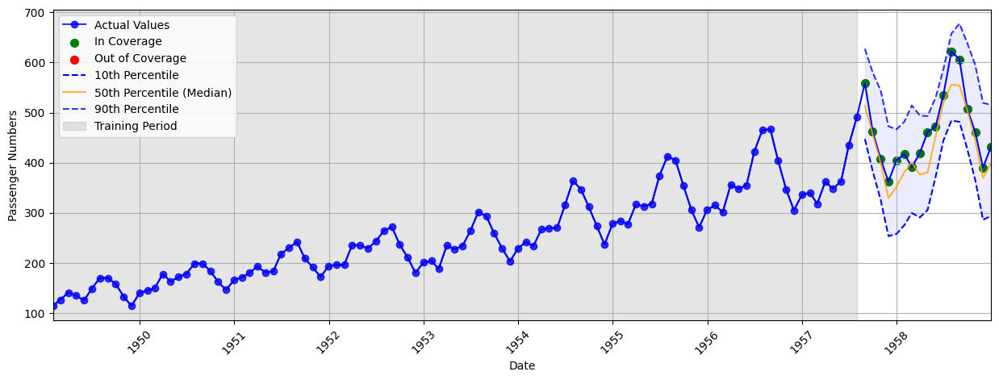

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile (median)
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])
prediction_median_data = np.concatenate([np.full_like(y_train_inverse, np.nan), predictions_median])

# Generate date range for x-axis
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[0], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

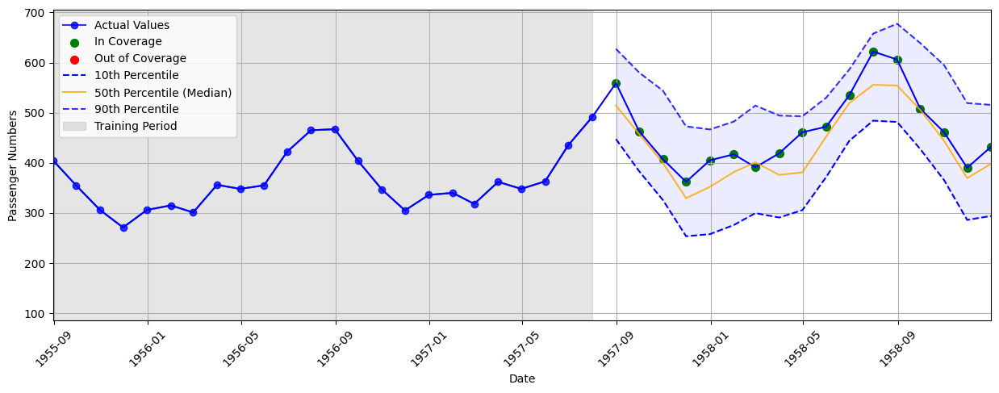

In [ ]:
# Inverse transform train and test data
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

# Extract quantile predictions and inverse transform
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])

# Generate date range for x-axis (if period index exists in your dataset)
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[len(y_train_inverse) - 24], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

#### $\alpha = 0.1$

In [ ]:
alpha = 0.1
calibration_size = 50  # Use the last 50 samples for calibration

calibration_data = y_train[-calibration_size:]
calibration_predictions = model.predict(x_train[-calibration_size:])

calibration_lower = calibration_predictions[:, 0]  # 10th percentile
calibration_median = calibration_predictions[:, 1]  # 50th percentile
calibration_upper = calibration_predictions[:, 2]  # 90th percentile

calibration_scores_lower = np.abs(calibration_lower - calibration_data.flatten())
calibration_scores_upper = np.abs(calibration_upper - calibration_data.flatten())

weights = calculate_weights(len(calibration_scores_lower))
normalized_weights = weights / np.sum(weights)

lower_bounds = []
upper_bounds = []

for i in range(len(x_test)):
    test_prediction = model.predict(x_test[i].reshape(1, -1, 1), verbose=0).flatten()

    test_lower = test_prediction[0]
    test_upper = test_prediction[2]

    qhat_lower = weighted_quantile(
        calibration_scores_lower,
        quantile=1 - alpha,
        weights=normalized_weights
    )
    qhat_upper = weighted_quantile(
        calibration_scores_upper,
        quantile=1 - alpha,
        weights=normalized_weights
    )

    lower_bound = test_lower - qhat_lower
    upper_bound = test_upper + qhat_upper

    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

lower_bounds = np.array(lower_bounds)
upper_bounds = np.array(upper_bounds)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
lower_bounds_inverse = scaler.inverse_transform(lower_bounds.reshape(-1, 1)).flatten()
upper_bounds_inverse = scaler.inverse_transform(upper_bounds.reshape(-1, 1)).flatten()

actual_values = y_test_inverse
coverage = np.mean((actual_values >= lower_bounds_inverse) & (actual_values <= upper_bounds_inverse))
avg_width = np.mean(upper_bounds_inverse - lower_bounds_inverse)

print(f"Average Interval Width: {avg_width:.2f}")
print(f"Coverage: {coverage * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Average Interval Width: 189.41
Coverage: 100.00%


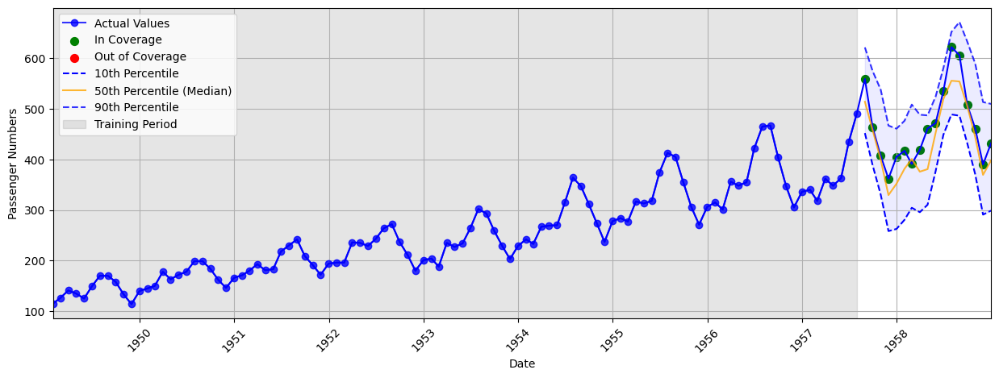

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile (median)
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])
prediction_median_data = np.concatenate([np.full_like(y_train_inverse, np.nan), predictions_median])

# Generate date range for x-axis
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[0], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

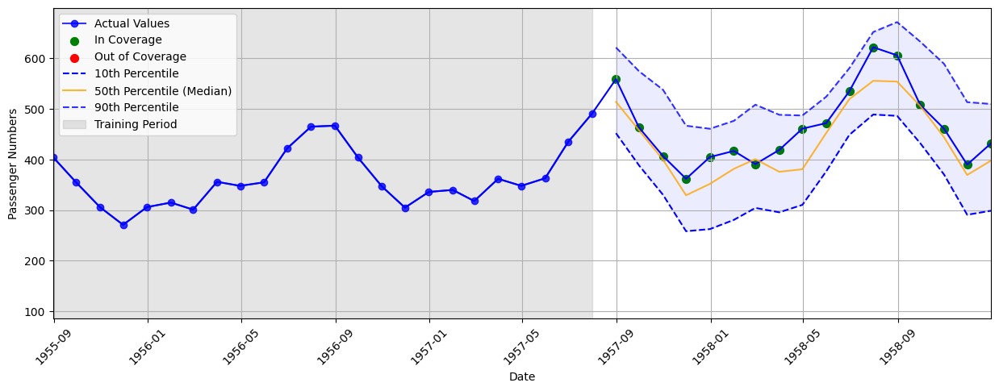

In [ ]:
# Inverse transform train and test data
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

# Extract quantile predictions and inverse transform
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])

# Generate date range for x-axis (if period index exists in your dataset)
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[len(y_train_inverse) - 24], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

### Adaptive Conformal Inference Under Distribution Shift

#### $\alpha = 0.05$

In [ ]:
def weighted_quantile(values, quantile, weights=None):
    if weights is None:
        weights = np.ones_like(values)
    sorter = np.argsort(values)
    values = values[sorter]
    weights = weights[sorter]
    cumulative_weights = np.cumsum(weights)
    cumulative_weights /= cumulative_weights[-1]
    return values[np.searchsorted(cumulative_weights, quantile)]

def calculate_weights(n, decay_factor=0.95):
    # Weights decrease exponentially as we go further back in time
    return np.array([decay_factor ** (n - i - 1) for i in range(n)])

In [ ]:
alpha = 0.05
gamma = 0.005
calibration_size = 50  # Use the last 50 samples for calibration

calibration_data = y_train[-calibration_size:]
calibration_predictions = model.predict(x_train[-calibration_size:])

calibration_lower = calibration_predictions[:, 0]  # 10th percentile
calibration_median = calibration_predictions[:, 1]  # 50th percentile
calibration_upper = calibration_predictions[:, 2]  # 90th percentile

calibration_scores_lower = np.abs(calibration_lower - calibration_data.flatten())
calibration_scores_upper = np.abs(calibration_upper - calibration_data.flatten())

weights = calculate_weights(len(calibration_scores_lower))
normalized_weights = weights / np.sum(weights)

# Initialize adaptive alpha
alpha_t = alpha

lower_bounds = []
upper_bounds = []

for i in range(len(x_test)):
    test_prediction = model.predict(x_test[i].reshape(1, -1, 1), verbose=0).flatten()

    test_lower = test_prediction[0]
    test_upper = test_prediction[2]

    qhat_lower = weighted_quantile(
        calibration_scores_lower,
        quantile=1 - alpha_t,
        weights=normalized_weights
    )
    qhat_upper = weighted_quantile(
        calibration_scores_upper,
        quantile=1 - alpha_t,
        weights=normalized_weights
    )

    lower_bound = test_lower - qhat_lower
    upper_bound = test_upper + qhat_upper

    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

    # Update alpha adaptively based on miscoverage
    actual_value = y_test[i]
    if lower_bound <= actual_value <= upper_bound:
        err_t = 0  # In coverage
    else:
        err_t = 1  # Out of coverage

    # Adaptive update
    alpha_t = alpha_t + gamma * (alpha - err_t)

lower_bounds = np.array(lower_bounds)
upper_bounds = np.array(upper_bounds)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
lower_bounds_inverse = scaler.inverse_transform(lower_bounds.reshape(-1, 1)).flatten()
upper_bounds_inverse = scaler.inverse_transform(upper_bounds.reshape(-1, 1)).flatten()

actual_values = y_test_inverse
coverage = np.mean((actual_values >= lower_bounds_inverse) & (actual_values <= upper_bounds_inverse))
avg_width = np.mean(upper_bounds_inverse - lower_bounds_inverse)

print(f"Average Interval Width: {avg_width:.2f}")
print(f"Coverage: {coverage * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 390ms/step
Average Interval Width: 135.94
Coverage: 100.00%


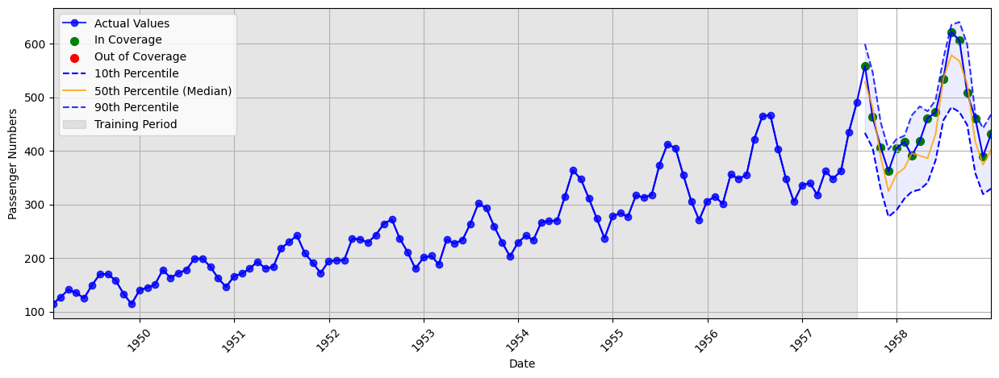

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile (median)
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])
prediction_median_data = np.concatenate([np.full_like(y_train_inverse, np.nan), predictions_median])

# Generate date range for x-axis
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[0], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

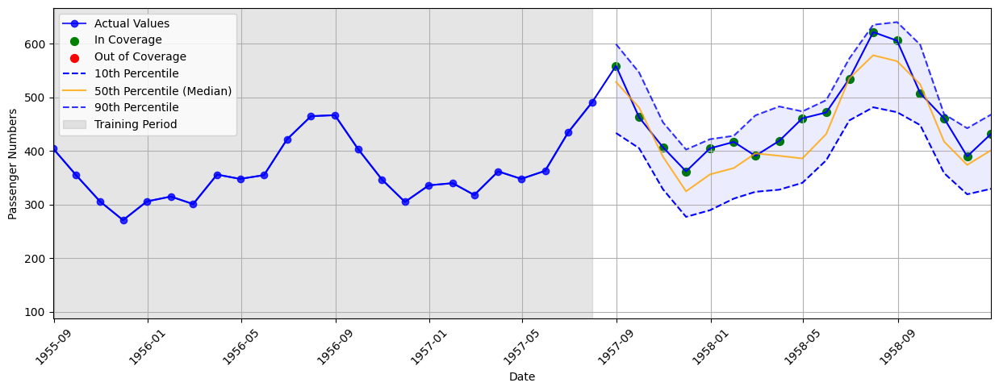

In [ ]:
# Inverse transform train and test data
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

# Extract quantile predictions and inverse transform
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])

# Generate date range for x-axis (if period index exists in your dataset)
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[len(y_train_inverse) - 24], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

#### $\alpha = 0.1$

In [ ]:
alpha = 0.1
gamma = 0.005
calibration_size = 50  # Use the last 50 samples for calibration

calibration_data = y_train[-calibration_size:]
calibration_predictions = model.predict(x_train[-calibration_size:])

calibration_lower = calibration_predictions[:, 0]  # 10th percentile
calibration_median = calibration_predictions[:, 1]  # 50th percentile
calibration_upper = calibration_predictions[:, 2]  # 90th percentile

calibration_scores_lower = np.abs(calibration_lower - calibration_data.flatten())
calibration_scores_upper = np.abs(calibration_upper - calibration_data.flatten())

weights = calculate_weights(len(calibration_scores_lower))
normalized_weights = weights / np.sum(weights)

# Initialize adaptive alpha
alpha_t = alpha

lower_bounds = []
upper_bounds = []

for i in range(len(x_test)):
    test_prediction = model.predict(x_test[i].reshape(1, -1, 1), verbose=0).flatten()

    test_lower = test_prediction[0]
    test_upper = test_prediction[2]

    qhat_lower = weighted_quantile(
        calibration_scores_lower,
        quantile=1 - alpha_t,
        weights=normalized_weights
    )
    qhat_upper = weighted_quantile(
        calibration_scores_upper,
        quantile=1 - alpha_t,
        weights=normalized_weights
    )

    lower_bound = test_lower - qhat_lower
    upper_bound = test_upper + qhat_upper

    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

    # Update alpha adaptively based on miscoverage
    actual_value = y_test[i]
    if lower_bound <= actual_value <= upper_bound:
        err_t = 0  # In coverage
    else:
        err_t = 1  # Out of coverage

    # Adaptive update
    alpha_t = alpha_t + gamma * (alpha - err_t)

lower_bounds = np.array(lower_bounds)
upper_bounds = np.array(upper_bounds)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
lower_bounds_inverse = scaler.inverse_transform(lower_bounds.reshape(-1, 1)).flatten()
upper_bounds_inverse = scaler.inverse_transform(upper_bounds.reshape(-1, 1)).flatten()

actual_values = y_test_inverse
coverage = np.mean((actual_values >= lower_bounds_inverse) & (actual_values <= upper_bounds_inverse))
avg_width = np.mean(upper_bounds_inverse - lower_bounds_inverse)

print(f"Average Interval Width: {avg_width:.2f}")
print(f"Coverage: {coverage * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Average Interval Width: 115.49
Coverage: 94.12%


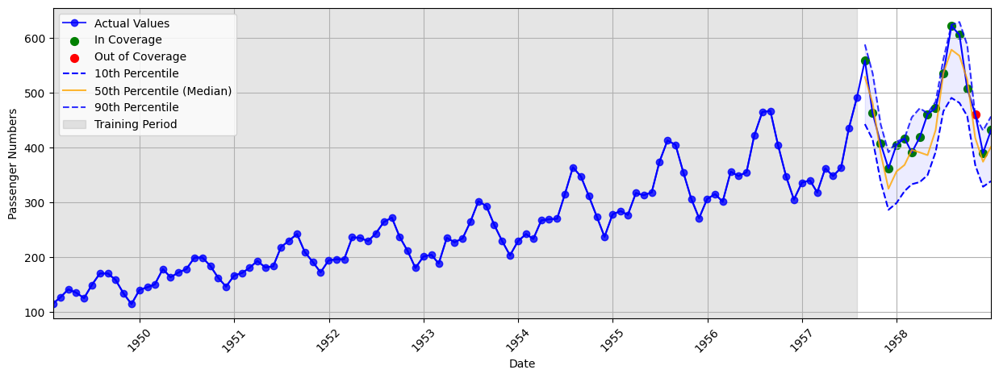

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile (median)
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])
prediction_median_data = np.concatenate([np.full_like(y_train_inverse, np.nan), predictions_median])

# Generate date range for x-axis
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[0], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

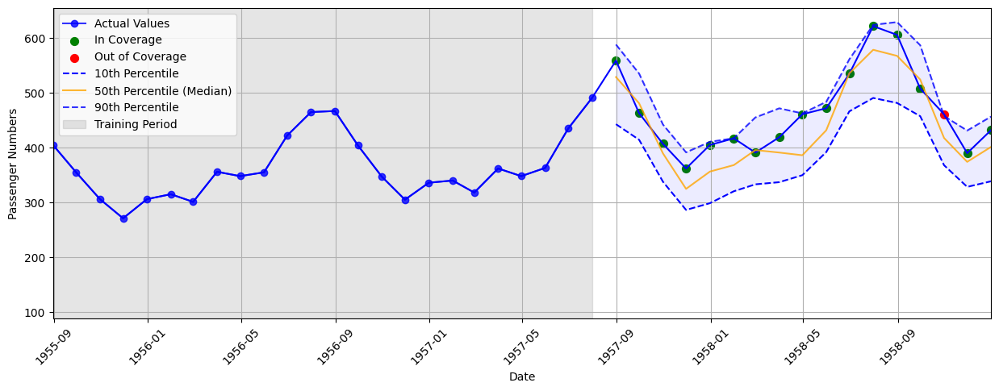

In [ ]:
# Inverse transform train and test data
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

conformal_lower = scaler.inverse_transform(lower_bounds.reshape(-1, 1))  # Conformalised lower bound
conformal_upper = scaler.inverse_transform(upper_bounds.reshape(-1, 1))  # Conformalised upper bound

# Extract quantile predictions and inverse transform
predictions_lower = scaler.inverse_transform(predictions[:, 0].reshape(-1, 1))  # 10th percentile
predictions_median = scaler.inverse_transform(predictions[:, 1].reshape(-1, 1))  # 50th percentile
predictions_upper = scaler.inverse_transform(predictions[:, 2].reshape(-1, 1))  # 90th percentile

# Concatenate train and test data for the plot
all_data = np.concatenate([y_train_inverse, y_test_inverse])

# Generate date range for x-axis (if period index exists in your dataset)
date_range = pd.date_range(start='1949-01', periods=len(all_data), freq='ME')  # Adjust start date and frequency as needed

in_coverage_x = []
in_coverage_y = []
out_of_coverage_x = []
out_of_coverage_y = []

for i, true_value in enumerate(y_test_inverse.flatten()):
    x = date_range[len(y_train_inverse) + i]
    if conformal_lower[i] <= true_value <= conformal_upper[i]:
        in_coverage_x.append(x)
        in_coverage_y.append(true_value)
    else:
        out_of_coverage_x.append(x)
        out_of_coverage_y.append(true_value)

plt.figure(figsize=(15, 5))
plt.plot(date_range[:len(y_train_inverse)], y_train_inverse, label="Actual Values", color="blue", marker="o", linestyle="-", alpha=0.8)
plt.plot(date_range, all_data, color="blue", linestyle="-")

plt.scatter(in_coverage_x, in_coverage_y, color="green", marker="o", s=50, label="In Coverage")
plt.scatter(out_of_coverage_x, out_of_coverage_y, color="red", marker="o", s=50, label="Out of Coverage")

plt.plot(date_range[len(y_train_inverse):], conformal_lower, color='blue', linestyle='--', label="10th Percentile")
plt.plot( date_range[len(y_train_inverse):], predictions_median, label="50th Percentile (Median)", color="orange", linestyle="-", alpha=0.8)
plt.plot(date_range[len(y_train_inverse):], conformal_upper, color="blue", linestyle="--", label="90th Percentile", alpha=0.8)
plt.fill_between(date_range[len(y_train_inverse):], conformal_lower.flatten(), conformal_upper.flatten(), color="blue", alpha=0.075)
plt.axvspan(date_range[0], date_range[len(y_train_inverse) - 1], color="grey", alpha=0.2, label="Training Period")

plt.xlabel("Date")
plt.ylabel("Passenger Numbers")
plt.legend(loc="upper left", fontsize=10)
plt.grid(True)
plt.xlim([date_range[len(y_train_inverse) - 24], date_range[-1]])

plt.xticks(rotation=45)
plt.show()

# Risk-aware Conformal Prediction

## Load the dataset

In [ ]:
digits = load_digits()
x = digits.images
y = digits.target.reshape(-1, 1)

### Visualise the dataset

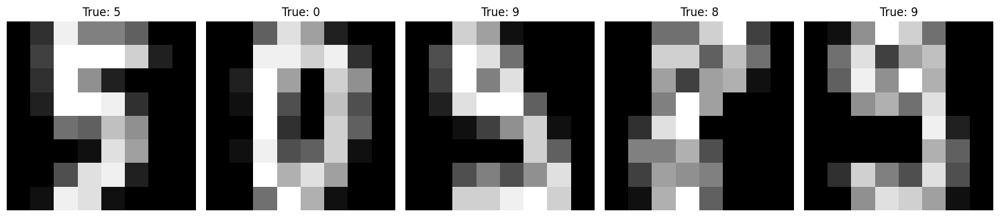

In [ ]:
n_samples = 5
start_index = 35
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the examples from index 5 to 9
for i, ax in enumerate(axes):
    img = x[start_index + i]
    label = y[start_index + i].item()
    ax.imshow(img, cmap='gray')
    ax.set_title(f"True: {label}", fontsize=12, color='black')
    ax.axis('off')
plt.tight_layout()
plt.show()

## Preprocess the dataset

In [ ]:
# Reshape arrays
x_reshaped = x.reshape((x.shape[0], 8, 8, 1))

# Standardize data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_reshaped.reshape(x_reshaped.shape[0], -1)).reshape(x_reshaped.shape)

# One-hot encode the labels/targets
encoder = OneHotEncoder(sparse_output=False)
y_one_hot = encoder.fit_transform(y.reshape(-1, 1))

# Train-test split data
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y_one_hot, test_size=0.2, random_state=42, stratify=y)
x_test, x_cal, y_test, y_cal = train_test_split(x_test, y_test, test_size=0.2, random_state=42, stratify=y_test)

# Display the shapes of the processed data
print(f"X_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_cal shape: {x_cal.shape}")
print(f"y_cal shape: {y_cal.shape}")
print(f"X_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (1437, 8, 8, 1)
y_train shape: (1437, 10)
X_cal shape: (72, 8, 8, 1)
y_cal shape: (72, 10)
X_test shape: (288, 8, 8, 1)
y_test shape: (288, 10)


## Train a base model

In [ ]:
def get_model():
  input_layer = Input(shape=(8, 8, 1))

  conv1 = Conv2D(16, kernel_size=(3, 3), activation='relu')(input_layer)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
  conv2 = Conv2D(32, kernel_size=(3, 3), activation='relu')(pool1)

  flatten = Flatten()(conv2)
  dense1 = Dense(32, activation='relu')(flatten)
  output_layer = Dense(10, activation='softmax')(dense1)

  model = Model(inputs=input_layer, outputs=output_layer)

  return model

In [ ]:
model = get_model()
batch_size = 32
epochs = 10

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

In [ ]:
# Let's see where the model went wrong to plot the best images
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)
incorrect_indices = np.where(y_pred_classes != y_true_classes)[0]
print("Indices of incorrect predictions:", incorrect_indices)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Indices of incorrect predictions: [ 12  31  49 133 189 197 241 282]


## Test the accuracy of the base model

In [ ]:
batch_size = 32

total_predicted = 0
total_correct = 0
batch_num = 0

x_test_limited = x_test[:50]
y_test_limited = y_test[:50]

num_batches = int(np.ceil(len(x_test_limited) / batch_size))

with tqdm(total=num_batches, desc="Processing images", unit="batch") as pbar:
    for i in range(0, len(x_test_limited), batch_size):
        batch_images = x_test_limited[i:i + batch_size]
        batch_labels = y_test_limited[i:i + batch_size]

        # Get model predictions for the batch
        train_pred = model.predict_on_batch(batch_images)
        predicted_classes = np.argmax(train_pred, axis=1)
        true_classes = np.argmax(batch_labels, axis=1)

        # Count the number of correct predictions
        num_correct = np.sum(predicted_classes == true_classes)
        total_predicted += len(batch_labels)
        total_correct += num_correct
        current_accuracy = 100.0 * total_correct / total_predicted

        # Update tqdm progress bar
        pbar.set_postfix({
            "Batch No.": batch_num + 1,
            "Accuracy": f"{current_accuracy:.2f}%",
            "Total Images Processed": total_predicted
        })
        pbar.update(1)
        batch_num += 1

# Print final accuracy
print(f"\nFinal Accuracy: {100.0 * total_correct / total_predicted:.2f}% from {total_predicted} samples")

Processing images: 100%|██████████| 2/2 [00:00<00:00, 304.19batch/s, Batch No.=2, Accuracy=94.00%, Total Images Processed=50]


Final Accuracy: 94.00% from 50 samples


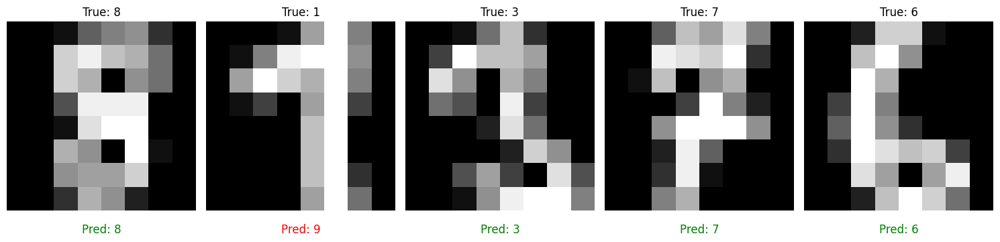

In [ ]:
n_samples = 5
start_index = 30
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Model prediction
    pred = model.predict(img_preprocessed, verbose=0)
    predicted_label = np.argmax(pred, axis=1)[0]

    # Determine color for the label: green if correct, red if incorrect
    color = 'green' if predicted_label == true_label else 'red'

    # show unprocessed image by reverse scaling it
    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)

    # Plot the image
    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Add predicted label just below the true label, colored accordingly
    axes[i - start_index].annotate(f"Pred: {predicted_label}",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

## Risk-aware CP

### Regular weights

In [ ]:
weights = np.ones(10)  # Initialize weights for all classes

# Step 1: Get predictions on the calibration set
cal_probs = model.predict(x_cal)  # Predict probabilities for the calibration set

# Step 2: Compute nonconformity scores
cal_scores = []  # Store the scores for all calibration samples
for i in range(len(y_cal)):
    true_label = np.argmax(y_cal[i])
    true_prob = cal_probs[i, true_label]
    score = weights[true_label] * (1 - true_prob)  # Cost-sensitive nonconformity score
    cal_scores.append(score)
cal_scores = np.array(cal_scores)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


In [ ]:
alpha = 0.01
q_hat = np.quantile(cal_scores, 1 - alpha)

test_probs = model.predict(x_test)

top_1_correct = 0
top_5_correct = 0
coverage = 0

for i in range(len(test_probs)):
    prob_vector = test_probs[i]
    true_label = np.argmax(y_test[i])

    # Create prediction set for this test point
    prediction_set = []
    for label in range(10):
        # Compute the cost-sensitive score for each label
        score = weights[label] * (1 - prob_vector[label])
        if score <= q_hat:  # Include the label if the score is below the threshold
            prediction_set.append(label)

    # Top-1 accuracy
    if np.argmax(prob_vector) == true_label:
        top_1_correct += 1

    # Top-5 accuracy
    if true_label in np.argsort(prob_vector)[-5:]:
        top_5_correct += 1

    # Coverage
    if true_label in prediction_set:
        coverage += 1

# Calculate metrics
top_1_acc = top_1_correct / len(y_test)
top_5_acc = top_5_correct / len(y_test)
coverage = coverage / len(y_test)

print(f"Top-1 Accuracy: {top_1_acc:.2f}")
print(f"Top-5 Accuracy: {top_5_acc:.2f}")
print(f"Coverage: {coverage:.2f}")

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Top-1 Accuracy: 0.97
Top-5 Accuracy: 1.00
Coverage: 0.98


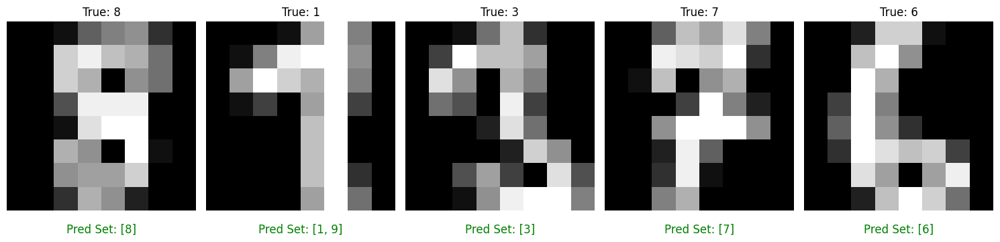

In [ ]:
n_samples = 5
start_index = 30
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)  # Adjust shape for MNIST
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Model prediction and probability scores
    pred = model.predict(img_preprocessed, verbose=0)[0]
    predicted_label = np.argmax(pred)

    # Create prediction set for this example
    prediction_set = []
    for label in range(10):
        score = weights[label] * (1 - pred[label])
        if score <= q_hat:
            prediction_set.append(label)

    # Determine color for the predicted label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set else 'red'

    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)

    # Plot the original image
    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, prediction_set))
    # Color the prediction set label according to whether it contains the true label
    color = 'green' if true_label in prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

### Digit 1 has a higher weight

In [ ]:
weights = np.ones(10)  # Initialize weights for all classes
weights[1] = 2         # Set higher weight for digit '1'

# Step 1: Get predictions on the calibration set
cal_probs = model.predict(x_cal)  # Predict probabilities for the calibration set

# Step 2: Compute nonconformity scores
cal_scores = []  # Store the scores for all calibration samples
for i in range(len(y_cal)):
    true_label = np.argmax(y_cal[i])
    true_prob = cal_probs[i, true_label]
    score = weights[true_label] * (1 - true_prob)  # Cost-sensitive nonconformity score
    cal_scores.append(score)
cal_scores = np.array(cal_scores)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


In [ ]:
alpha = 0.025
q_hat = np.quantile(cal_scores, 1 - alpha)

test_probs = model.predict(x_test)

top_1_correct = 0
top_5_correct = 0
coverage = 0

for i in range(len(test_probs)):
    prob_vector = test_probs[i]
    true_label = np.argmax(y_test[i])

    # Create prediction set for this test point
    prediction_set = []
    for label in range(10):
        # Compute the cost-sensitive score for each label
        score = weights[label] * (1 - prob_vector[label])
        if score <= q_hat:  # Include the label if the score is below the threshold
            prediction_set.append(label)

    # Top-1 accuracy
    if np.argmax(prob_vector) == true_label:
        top_1_correct += 1

    # Top-5 accuracy
    if true_label in np.argsort(prob_vector)[-5:]:
        top_5_correct += 1

    # Coverage
    if true_label in prediction_set:
        coverage += 1

# Calculate metrics
top_1_acc = top_1_correct / len(y_test)
top_5_acc = top_5_correct / len(y_test)
coverage = coverage / len(y_test)

print(f"Top-1 Accuracy: {top_1_acc:.2f}")
print(f"Top-5 Accuracy: {top_5_acc:.2f}")
print(f"Coverage: {coverage:.2f}")

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Top-1 Accuracy: 0.97
Top-5 Accuracy: 1.00
Coverage: 0.95


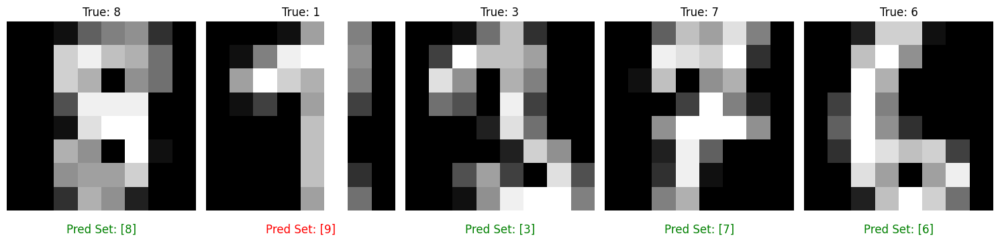

In [ ]:
n_samples = 5
start_index = 30
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)  # Adjust shape for MNIST
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Model prediction and probability scores
    pred = model.predict(img_preprocessed, verbose=0)[0]
    predicted_label = np.argmax(pred)

    # Create prediction set for this example
    prediction_set = []
    for label in range(10):
        score = weights[label] * (1 - pred[label])
        if score <= q_hat:
            prediction_set.append(label)

    # Determine color for the predicted label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set else 'red'

    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)

    # Plot the original image
    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, prediction_set))
    # Color the prediction set label according to whether it contains the true label
    color = 'green' if true_label in prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
weights = np.ones(10)  # Initialize weights for all classes
weights[1] = 0.5         # Set higher weight for digit '1'

# Step 1: Get predictions on the calibration set
cal_probs = model.predict(x_cal)  # Predict probabilities for the calibration set

# Step 2: Compute nonconformity scores
cal_scores = []  # Store the scores for all calibration samples
for i in range(len(y_cal)):
    true_label = np.argmax(y_cal[i])
    true_prob = cal_probs[i, true_label]
    score = weights[true_label] * (1 - true_prob)  # Cost-sensitive nonconformity score
    cal_scores.append(score)
cal_scores = np.array(cal_scores)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


In [ ]:
alpha = 0.025
q_hat = np.quantile(cal_scores, 1 - alpha)

test_probs = model.predict(x_test)

top_1_correct = 0
top_5_correct = 0
coverage = 0

for i in range(len(test_probs)):
    prob_vector = test_probs[i]
    true_label = np.argmax(y_test[i])

    # Create prediction set for this test point
    prediction_set = []
    for label in range(10):
        # Compute the cost-sensitive score for each label
        score = weights[label] * (1 - prob_vector[label])
        if score <= q_hat:  # Include the label if the score is below the threshold
            prediction_set.append(label)

    # Top-1 accuracy
    if np.argmax(prob_vector) == true_label:
        top_1_correct += 1

    # Top-5 accuracy
    if true_label in np.argsort(prob_vector)[-5:]:
        top_5_correct += 1

    # Coverage
    if true_label in prediction_set:
        coverage += 1

# Calculate metrics
top_1_acc = top_1_correct / len(y_test)
top_5_acc = top_5_correct / len(y_test)
coverage = coverage / len(y_test)

print(f"Top-1 Accuracy: {top_1_acc:.2f}")
print(f"Top-5 Accuracy: {top_5_acc:.2f}")
print(f"Coverage: {coverage:.2f}")

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Top-1 Accuracy: 0.97
Top-5 Accuracy: 1.00
Coverage: 0.94


Prob of 1: 0.31533658504486084
Prob of 9: 0.4302651882171631


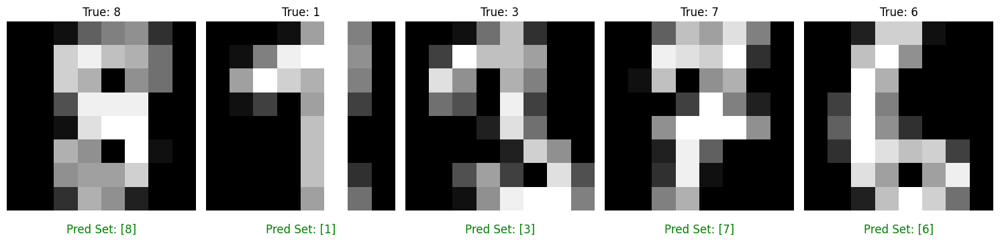

In [ ]:
n_samples = 5
start_index = 30
stop_index = start_index + n_samples

fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))

# Iterate through the selected examples from X_test and y_test
for i in range(start_index, stop_index):
    img = x_test[i].reshape(8, 8)  # Adjust shape for MNIST
    true_label = np.argmax(y_test[i])
    img_preprocessed = np.expand_dims(x_test[i], axis=0)

    # Model prediction and probability scores
    pred = model.predict(img_preprocessed, verbose=0)[0]
    predicted_label = np.argmax(pred)

    # Create prediction set for this example
    prediction_set = []
    for label in range(10):
        score = weights[label] * (1 - pred[label])
        if score <= q_hat:
            prediction_set.append(label)
        if i == 31 and label == 1:
          print("Prob of 1: {}".format(score))
        if i == 31 and label == 9:
              print("Prob of 9: {}".format(score))

    # Determine color for the predicted label: green if correct, red if incorrect
    color = 'green' if true_label in prediction_set else 'red'

    img_flattened = img.reshape(64)
    img_transformed = scaler.inverse_transform(img_flattened.reshape(1, -1)).reshape(8, 8)

    # Plot the original image
    axes[i - start_index].imshow(img_transformed, cmap='gray')
    axes[i - start_index].set_title(f"True: {true_label}", fontsize=12, color='black')

    # Format the prediction set for display
    prediction_set_str = ', '.join(map(str, prediction_set))
    # Color the prediction set label according to whether it contains the true label
    color = 'green' if true_label in prediction_set else 'red'

    # Annotate the image with the prediction set
    axes[i - start_index].annotate(f"Pred Set: [{prediction_set_str}]",
                                   xy=(0.5, -0.1), xycoords='axes fraction',
                                   ha='center', va='center',
                                   fontsize=12, color=color)
    axes[i - start_index].axis('off')

plt.tight_layout()
plt.show()